In [92]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import KMeans
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics.cluster import normalized_mutual_info_score
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.mixture import GaussianMixture as EM
from sklearn.model_selection import learning_curve
from time import time

# Clustering Algorithm

## K-means 

(3918, 13)


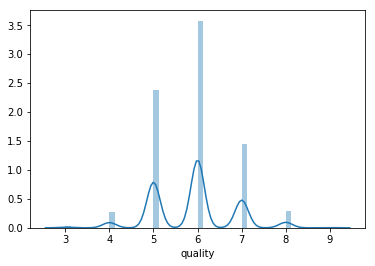

In [2]:
data = pd.read_csv("data/winequality.csv")
print(data.shape)
X = data.iloc[:,:11]
y = data.iloc[:,11]
def normalize(dataset):
    dataNorm=((dataset-dataset.min())/(dataset.max()-dataset.min()))*20
    return dataNorm
X = normalize(X)
ax = sns.distplot(data['quality'])
plt.show()
X_norm = X

## How to evalute the clustering algorithm performance?
Evaluating the performance of a clustering algorithm is not as trivial as counting the number of errors or the precision and recall of a supervised classification algorithm. In particular any evaluation metric should not take the absolute values of the cluster labels into account but rather if this clustering define separations of the data similar to some ground truth set of classes or satisfying some assumption such that members belong to the same class are more similar that members of different classes according to some similarity metric.

https://scikit-learn.org/stable/modules/clustering.html#clustering-performance-evaluation  
https://stats.stackexchange.com/questions/79028/performance-metrics-to-evaluate-unsupervised-learning

In [74]:
def visialize(X,y):
    LABEL_COLOR_MAP = {0 : 'k',
                   1 : 'red',
                   2 : 'tan',
                   3 : 'green',
                   4 : 'navy',
                   5 : 'plum',
                   6 : 'yellow',
                   7 : 'lightgrey',
                   }
    label_color = [LABEL_COLOR_MAP[l] for l in y]
    for i in range(10):
        for j in range(i,11):
            centers = kmeans.cluster_centers_
            plt.scatter( X.iloc[:, i], X.iloc[:, j],c = label_color,s = 1)
       
            plt.xlabel(list(X.columns.values)[i])
            plt.ylabel(list(X.columns.values)[j])
            plt.title("Wine: plot on projected space")
            plt.savefig("./figures/wine/%s_%s.jpg"%(num,i,j))
            plt.show()

**To visualize, I project the points to 2-D space, I tried every combination of 2-D axises to find the best visualization**  
**All the figures are in figures/wine/ folder**

In [53]:
def K_MEANS(X_norm,y,ss):
    for num in range(3,9):
        print("---------------k = ",num," ------------")
        
        kmeans = KMeans(n_clusters=num) 
        kmeans.fit(X_norm)
        
        #visialize_clustering(kmeans,num)
        print("Adjusted Rand index: ",metrics.adjusted_rand_score(np.array(y), kmeans.labels_))
        print("Homogeneity: ",metrics.homogeneity_score(np.array(y), kmeans.labels_))
        print("completeness: ",metrics.completeness_score(np.array(y), kmeans.labels_))
        print("V-measure: ",metrics.v_measure_score(np.array(y), kmeans.labels_))
        print("Mutual Information: ",metrics.adjusted_mutual_info_score(np.array(y), kmeans.labels_))
        print("Silhouette Coefficient: ",metrics.silhouette_score(X_norm,kmeans.labels_, metric='euclidean'))

    for n_clusters in range(3,9):
        # Create a subplot with 1 row and 2 columns
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)

        # The 1st subplot is the silhouette plot
        # The silhouette coefficient can range from -1, 1 but in this example all
        # lie within [-0.1, 1]
        ax1.set_xlim([-0.1, 1])
        # The (n_clusters+1)*10 is for inserting blank space between silhouette
        # plots of individual clusters, to demarcate them clearly.
        ax1.set_ylim([0, len(X_norm) + (n_clusters + 1) * 10])

        # Initialize the clusterer with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        clusterer = KMeans(n_clusters=n_clusters, random_state=10).fit(X_norm)
        cluster_labels = clusterer.labels_
        print("NMI score: %.6f" % normalized_mutual_info_score(y, cluster_labels))

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed
        # clusters
        silhouette_avg = silhouette_score(X_norm, cluster_labels)
        print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X_norm, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.spectral(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed
        colors = cm.spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter( X_norm.iloc[:, 0], X_norm.iloc[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

        # Labeling the clusters
        centers = clusterer.cluster_centers_

        # Draw white circles at cluster centers
        ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

        for i, c in enumerate(centers):
            ax2.scatter( c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
        plt.savefig("./figures/wine/%s/K=%s.jpg"%(ss,n_clusters))
        plt.show()

---------------k =  3  ------------
Adjusted Rand index:  0.0698049558781
Homogeneity:  0.0756467777077
completeness:  0.0907475937793
V-measure:  0.0825119623072
Mutual Information:  0.0745008541041
Silhouette Coefficient:  0.193507961176
---------------k =  4  ------------
Adjusted Rand index:  0.0659272524142
Homogeneity:  0.0870096160683
completeness:  0.0828954777082
V-measure:  0.084902736332
Mutual Information:  0.0812613530867
Silhouette Coefficient:  0.173317296793
---------------k =  5  ------------
Adjusted Rand index:  0.060762731556
Homogeneity:  0.0885831400904
completeness:  0.0743452797689
V-measure:  0.0808421064725
Mutual Information:  0.0724098490327
Silhouette Coefficient:  0.169725806244
---------------k =  6  ------------
Adjusted Rand index:  0.0451378130445
Homogeneity:  0.0944035103088
completeness:  0.0694643624285
V-measure:  0.0800361845806
Mutual Information:  0.0673300228473
Silhouette Coefficient:  0.145398299278
---------------k =  7  ------------
Adjust

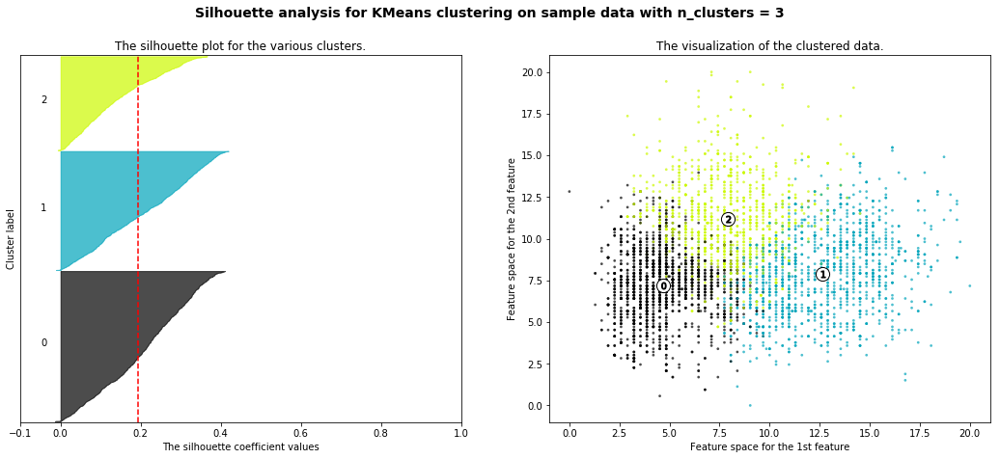

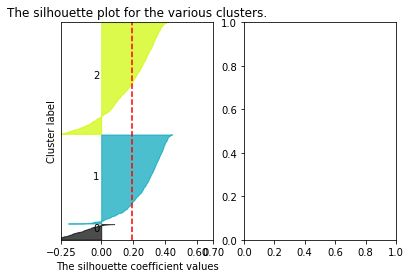

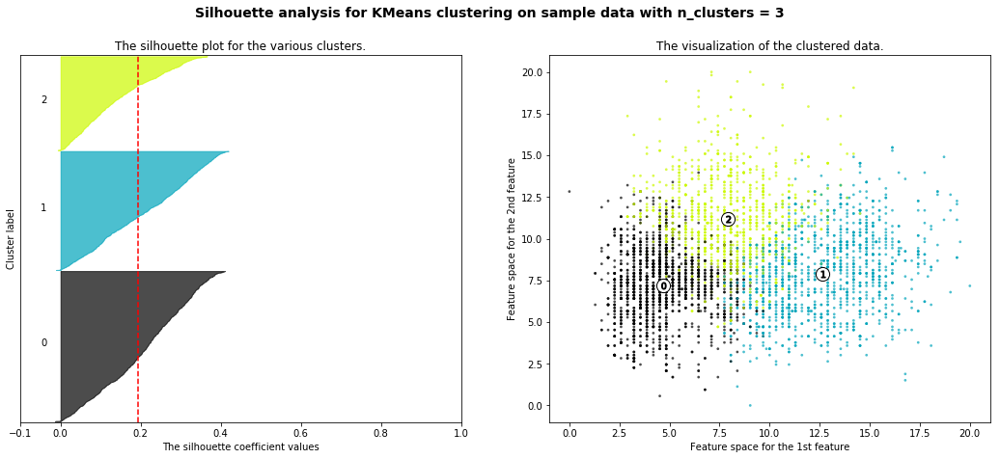

NMI score: 0.084505
For n_clusters = 4 The average silhouette_score is : 0.173278818677


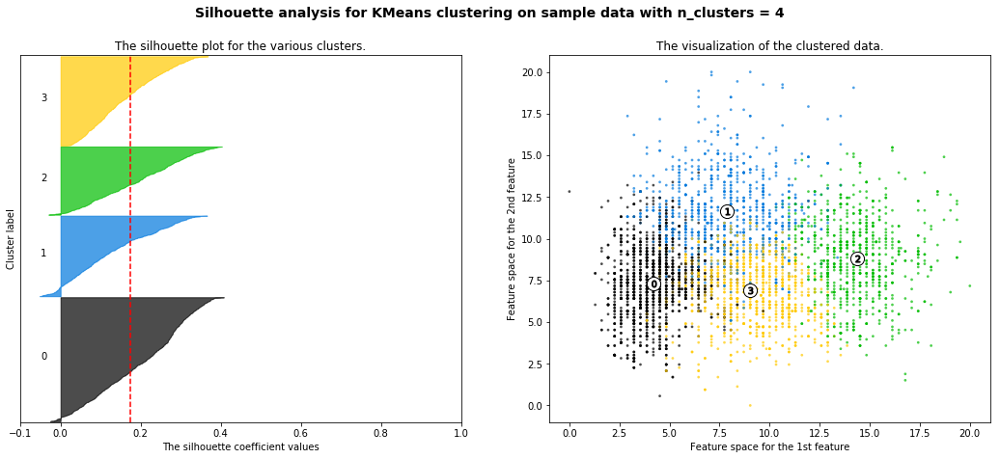

NMI score: 0.080615
For n_clusters = 5 The average silhouette_score is : 0.169537564557


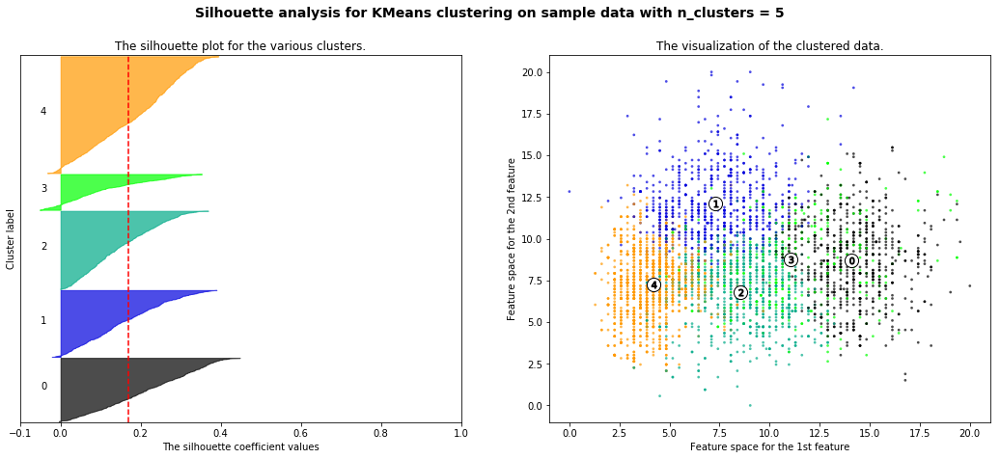

NMI score: 0.081843
For n_clusters = 6 The average silhouette_score is : 0.145547674365


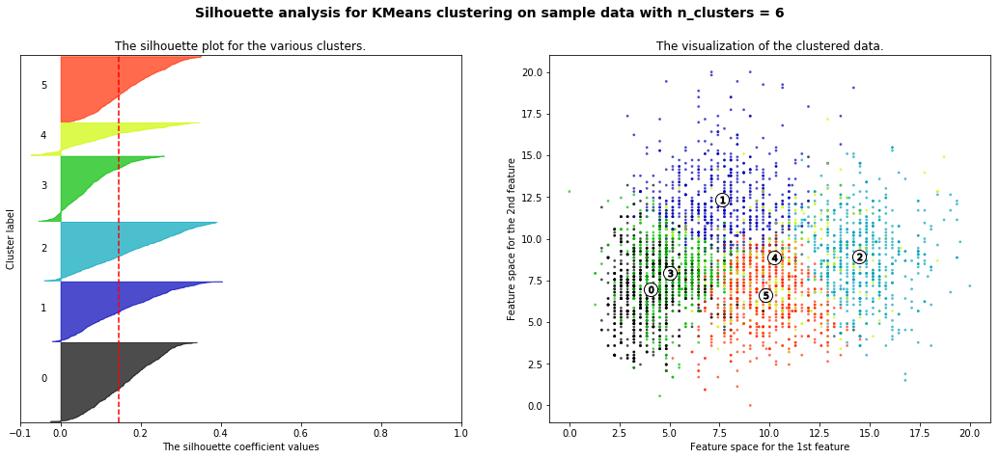

NMI score: 0.083131
For n_clusters = 7 The average silhouette_score is : 0.144768266149


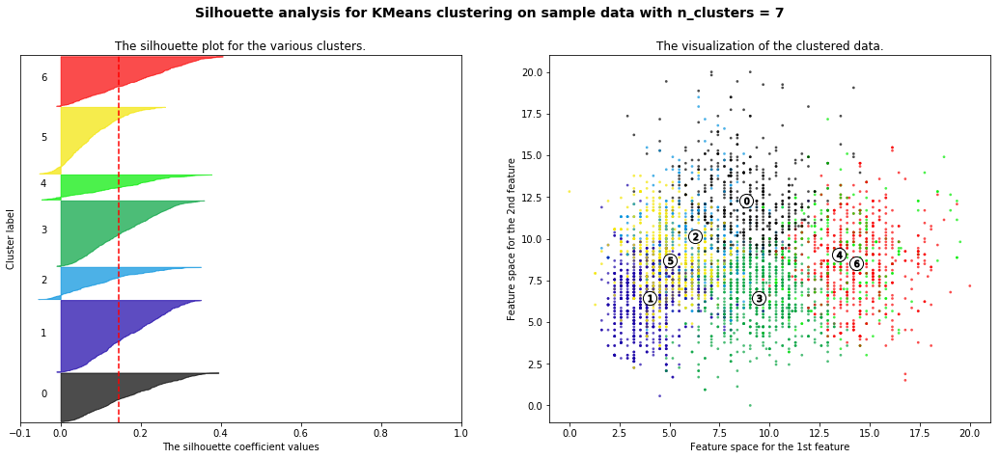

NMI score: 0.090088
For n_clusters = 8 The average silhouette_score is : 0.142966204618


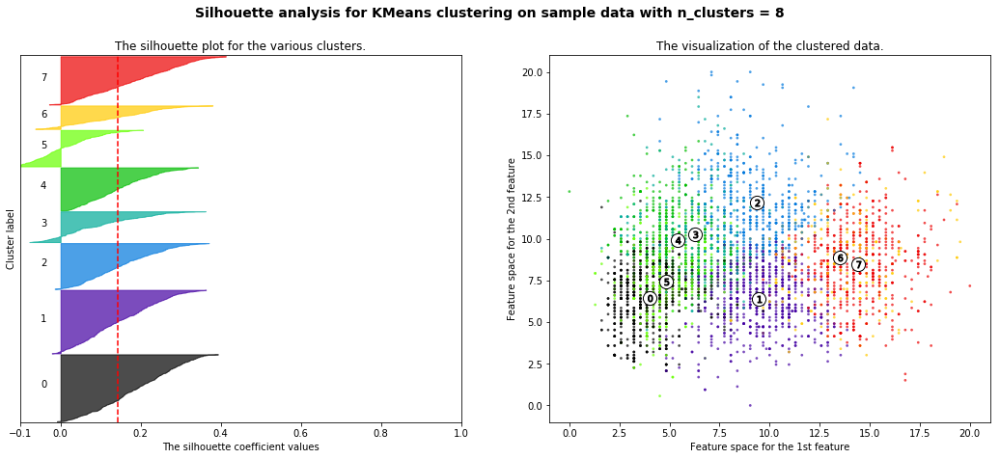

In [36]:
K_MEANS(X_norm,y,'kmeans')

## Expectation Maximization 

In [54]:
def Expectation_Maximization(X,y,ss):
    for num in range(3,9):
        print("---------------k = ",num," ------------")
        clusterer = EM(n_components=num, random_state=10)
        clusterer.fit(X)
        cluster_labels = clusterer.predict(X)
        #visialize_clustering(kmeans,num)
        print("Adjusted Rand index: ",metrics.adjusted_rand_score(np.array(y), cluster_labels))
        print("Homogeneity: ",metrics.homogeneity_score(np.array(y), cluster_labels))
        print("completeness: ",metrics.completeness_score(np.array(y), cluster_labels))
        print("V-measure: ",metrics.v_measure_score(np.array(y),cluster_labels))
        print("Mutual Information: ",metrics.adjusted_mutual_info_score(np.array(y),cluster_labels))
        print("Silhouette Coefficient: ",metrics.silhouette_score(X,cluster_labels, metric='euclidean'))

    for n_clusters in range(3,9):
        # Create a subplot with 1 row and 2 columns
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)

        # The 1st subplot is the silhouette plot
        # The silhouette coefficient can range from -1, 1 but in this example all
        # lie within [-0.1, 1]
        ax1.set_xlim([-0.1, 1])
        # The (n_clusters+1)*10 is for inserting blank space between silhouette
        # plots of individual clusters, to demarcate them clearly.
        ax1.set_ylim([0, len(X_norm) + (n_clusters + 1) * 10])

        # Initialize the clusterer with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        clusterer = EM(n_components=n_clusters, random_state=10)
        clusterer.fit(X)
        cluster_labels = clusterer.predict(X)
        print("NMI score: %.6f" % normalized_mutual_info_score(y, cluster_labels))

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed
        # clusters
        silhouette_avg = silhouette_score(X_norm, cluster_labels)
        print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X_norm, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.spectral(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed
        colors = cm.spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter( X_norm.iloc[:, 0], X_norm.iloc[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

        # Labeling the clusters
        centers = clusterer.means_

        # Draw white circles at cluster centers
        ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

        for i, c in enumerate(centers):
            ax2.scatter( c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(("Silhouette analysis for Expectation Maximization clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
        plt.savefig("./figures/wine/%s/K=%s.jpg"%(ss,n_clusters))
        plt.show()

---------------k =  3  ------------
Adjusted Rand index:  0.0595262436416
Homogeneity:  0.0717360267904
completeness:  0.103994405908
V-measure:  0.084904422913
Mutual Information:  0.0706021211692
Silhouette Coefficient:  0.19063425007
---------------k =  4  ------------
Adjusted Rand index:  0.0371859849297
Homogeneity:  0.0556733949951
completeness:  0.0572960303636
V-measure:  0.0564730593248
Mutual Information:  0.0539276875965
Silhouette Coefficient:  0.0722203111765
---------------k =  5  ------------
Adjusted Rand index:  0.0240926276629
Homogeneity:  0.0538661004683
completeness:  0.0470856508646
V-measure:  0.0502481703705
Mutual Information:  0.0450221023609
Silhouette Coefficient:  0.00374159793929
---------------k =  6  ------------
Adjusted Rand index:  0.0288287272398
Homogeneity:  0.0545821024227
completeness:  0.0439448943132
V-measure:  0.0486892892673
Mutual Information:  0.0415924888645
Silhouette Coefficient:  0.0278683411124
---------------k =  7  ------------
Adj

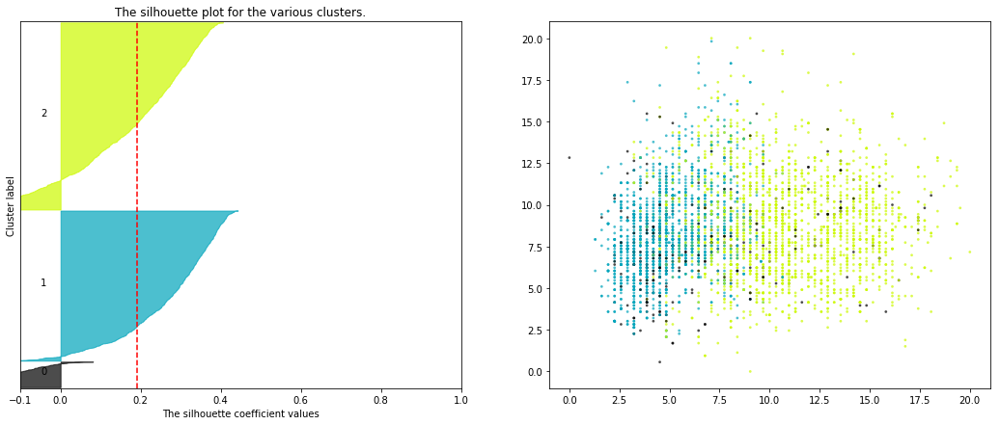

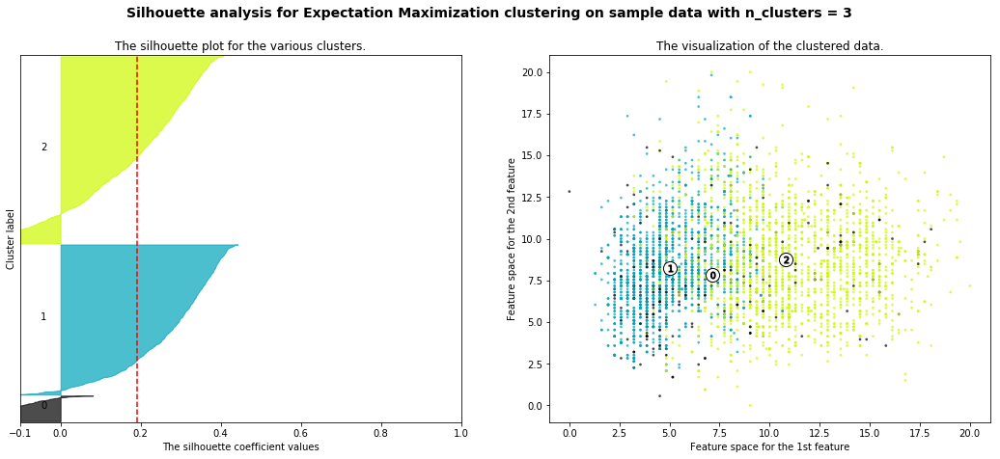

NMI score: 0.056479
For n_clusters = 4 The average silhouette_score is : 0.0722203111765


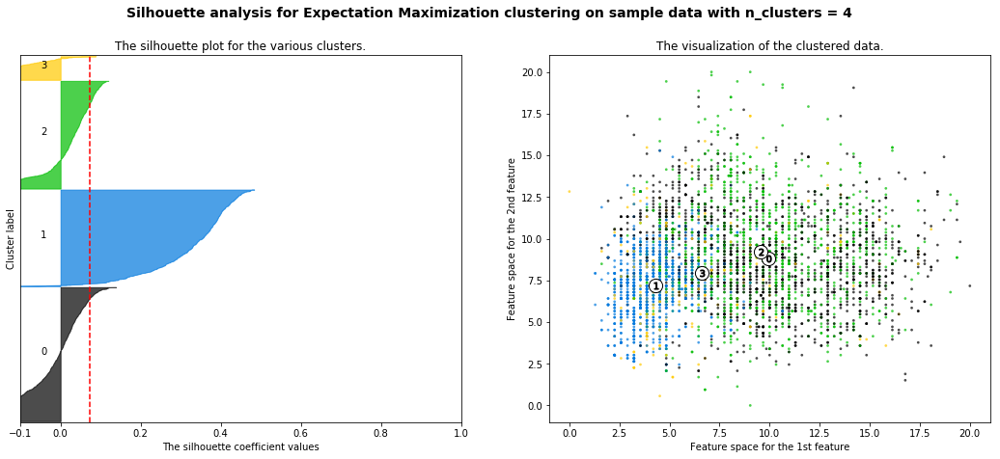

NMI score: 0.050362
For n_clusters = 5 The average silhouette_score is : 0.00374159793929


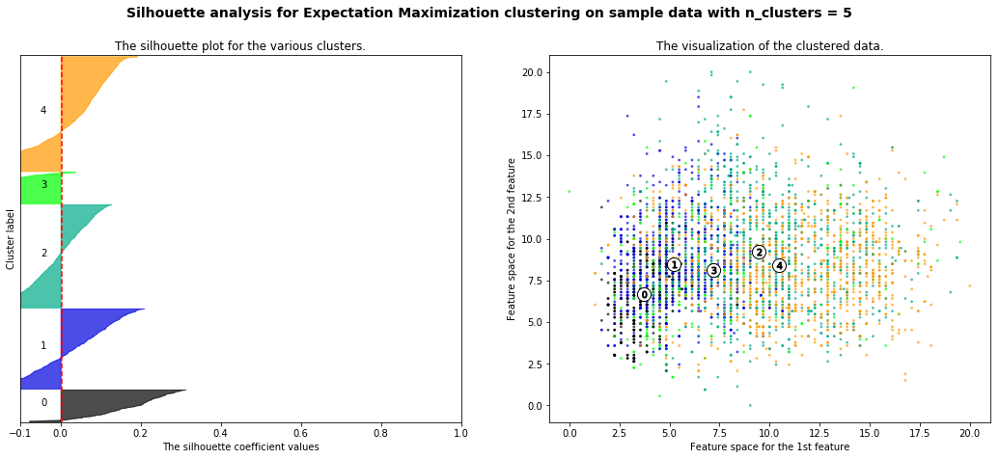

NMI score: 0.048976
For n_clusters = 6 The average silhouette_score is : 0.0278683411124


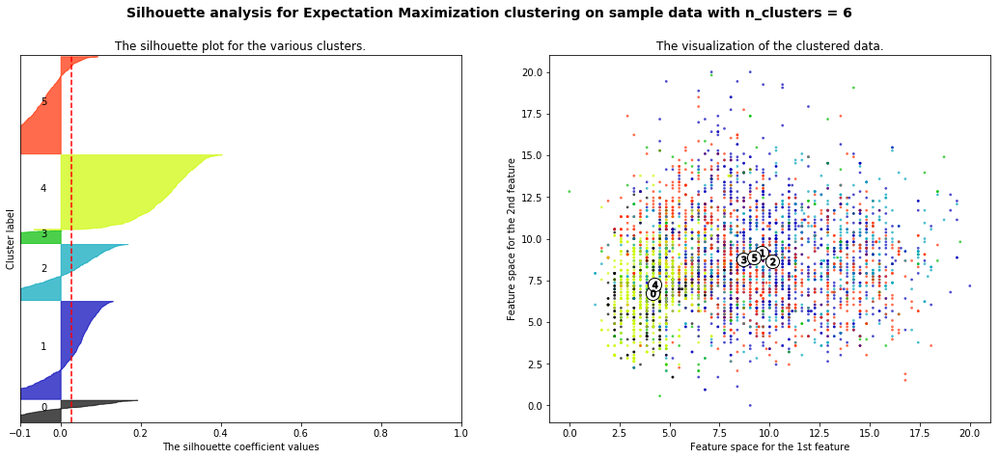

NMI score: 0.049041
For n_clusters = 7 The average silhouette_score is : 0.018729258165


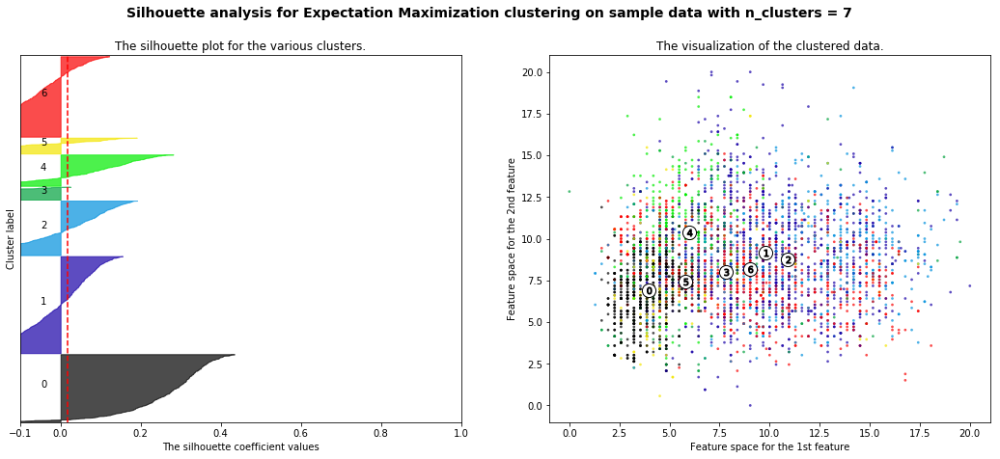

NMI score: 0.078178
For n_clusters = 8 The average silhouette_score is : 0.0173809312755


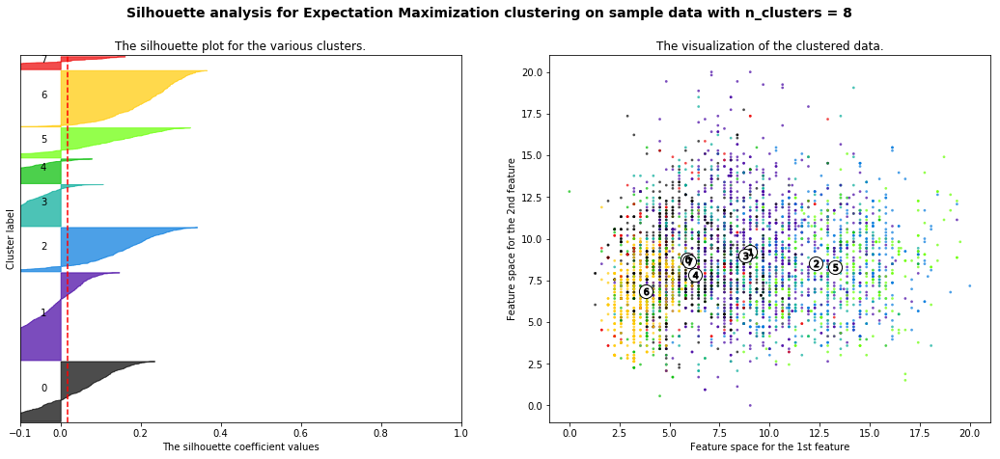

In [47]:
Expectation_Maximization(X,y,"EM")

# Dimensionality Reduction

## PCA 

In [4]:
from sklearn.decomposition import PCA

In [24]:
len(np.unique(y))

7

In [30]:
def visialize_PCA(X_r,noc):
    plt.figure()
    colors = [cm.spectral(float(i) / 7) for i in range(7)]
    lw = 2
    for m in range(0,noc - 1):
        for n in range(m,noc):
            for color, i in zip(colors, [i for i in range (7)]):
                plt.scatter(X_r[y == i, m], X_r[y == i, n], color=color, s=1,
                            label=i)
                plt.xlabel('%s principal component'%(n))
                plt.ylabel('%s principal component'%(m))
                plt.title('Visualizaion of principal component analysis on wine quality ')
            plt.legend(scatterpoints=1)
            plt.savefig('./figures/wine/PCA/noc=%s_%s_%s.png'%(noc,m,n))
            plt.show()

In [95]:
for num_components in range(3,11):
    pca = PCA(num_components)
    X_r = pca.fit(X).transform(X)
    loss = ((X-pca.inverse_transform(X_r))**2).mean().mean()
    print("num of components: %s reconstruction loss %s"%(num_components,loss))
    print(pca.explained_variance_)
   # visialize_PCA(X_r,num_components)

num of components: 3 reconstruction loss 1.4008944364954827
[ 19.24757819   9.21517817   6.56418537]
num of components: 4 reconstruction loss 1.0104912728233149
[ 19.24757819   9.21517817   6.56418537   4.29553116]
num of components: 5 reconstruction loss 0.7012683799377505
[ 19.24757819   9.21517817   6.56418537   4.29553116   3.4023202 ]
num of components: 6 reconstruction loss 0.49080838011022065
[ 19.24757819   9.21517817   6.56418537   4.29553116   3.4023202
   2.31565103]
num of components: 7 reconstruction loss 0.3160064901949658
[ 19.24757819   9.21517817   6.56418537   4.29553116   3.4023202
   2.31565103   1.92331168]
num of components: 8 reconstruction loss 0.16784397291498993
[ 19.24757819   9.21517817   6.56418537   4.29553116   3.4023202
   2.31565103   1.92331168   1.63020377]
num of components: 9 reconstruction loss 0.0629435229444363
[ 19.24757819   9.21517817   6.56418537   4.29553116   3.4023202
   2.31565103   1.92331168   1.63020377   1.15419954]
num of components:

## ICA 

In [5]:
from sklearn.decomposition import FastICA as ICA
from scipy.stats import kurtosis

In [98]:
def visialize_ICA(X_r,noc):
    plt.figure()
    colors = [cm.spectral(float(i) / 7) for i in range(7)]
    lw = 2
    for m in range(0,noc - 1):
        for n in range(m,noc):
            for color, i in zip(colors, [i for i in range (7)]):
                plt.scatter(X_r[y == i, m], X_r[y == i, n], color=color, s=1,
                            label=i)
                plt.xlabel('%s principal component'%(n))
                plt.ylabel('%s principal component'%(m))
                plt.title('Visualizaion of independent component analysis on wine quality ')
            plt.legend(scatterpoints=1)
            plt.savefig('./figures/wine/ICA/noc=%s_%s_%s.png'%(noc,m,n))
            plt.show()

num of components: 3 reconstruction loss: 1.4008944364954827 kurtosis: 1.5


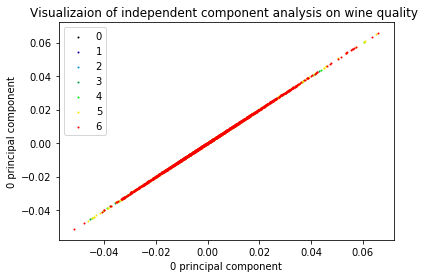

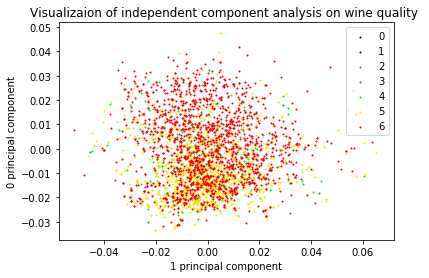

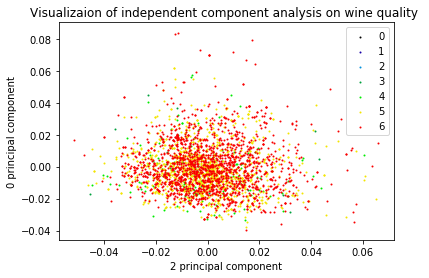

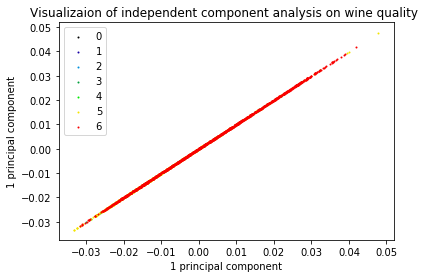

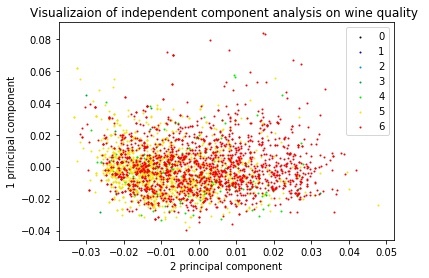

num of components: 4 reconstruction loss: 1.0104912728233144 kurtosis: 1.8267255081


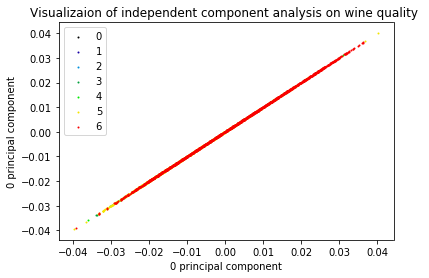

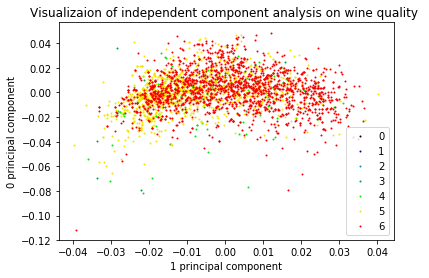

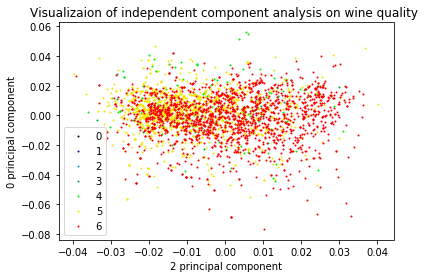

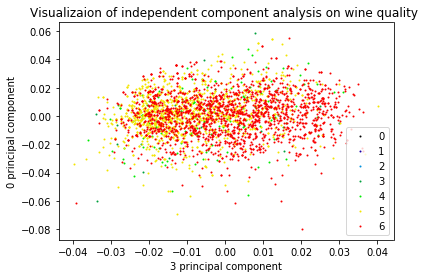

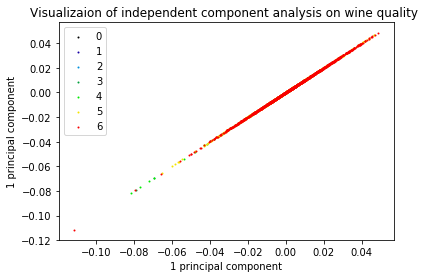

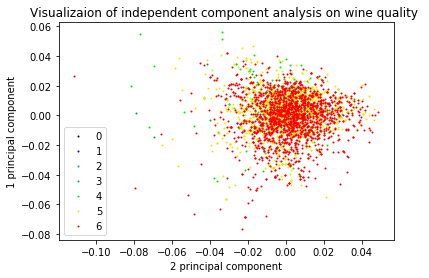

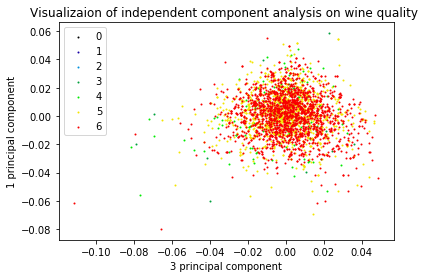

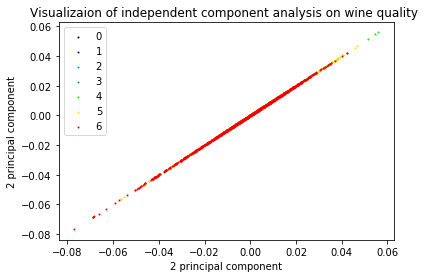

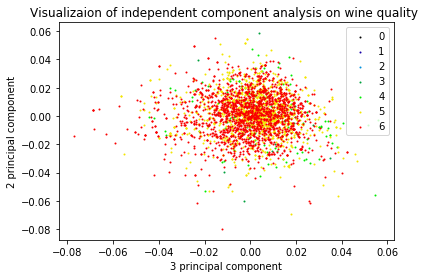

num of components: 5 reconstruction loss: 0.7012683799377503 kurtosis: 2.01471032349


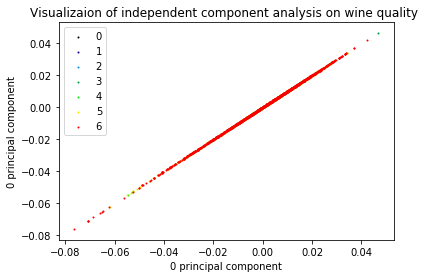

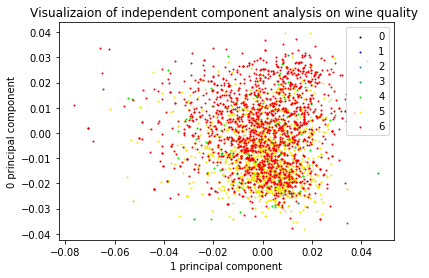

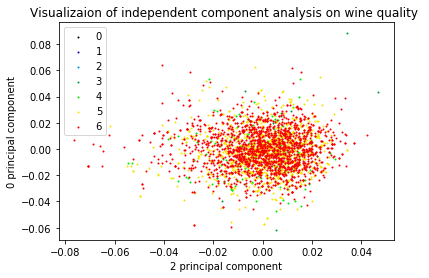

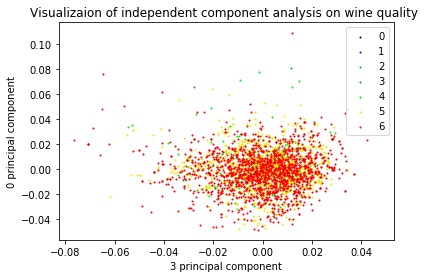

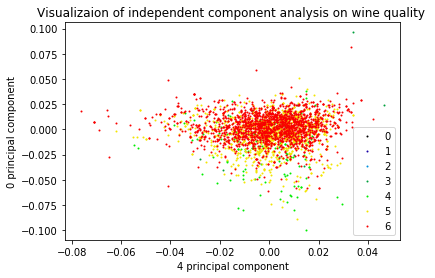

...

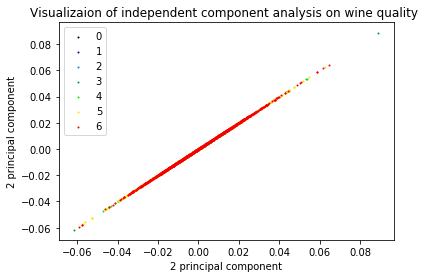

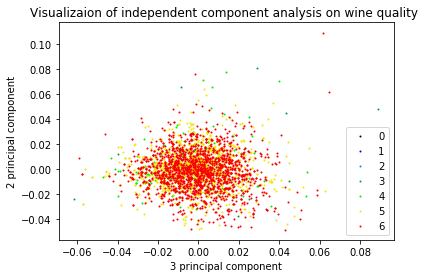

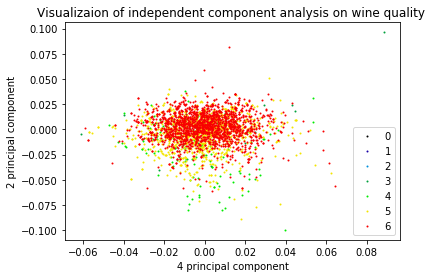

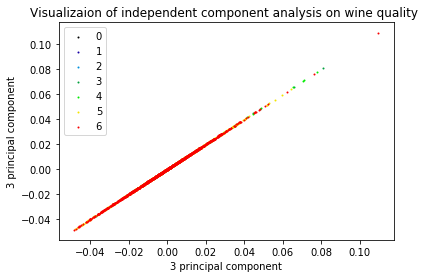

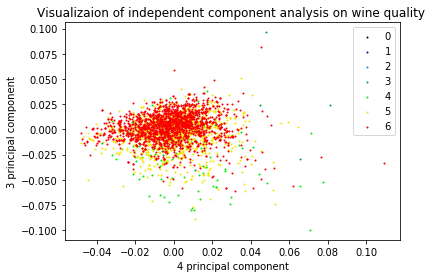

num of components: 6 reconstruction loss: 0.4908083801102206 kurtosis: 2.16593939302


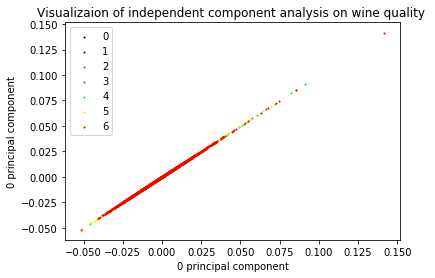

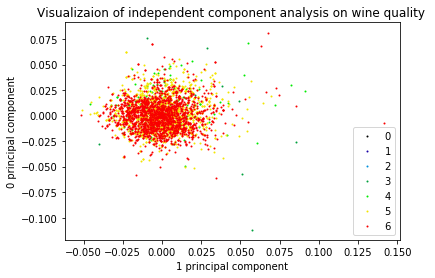

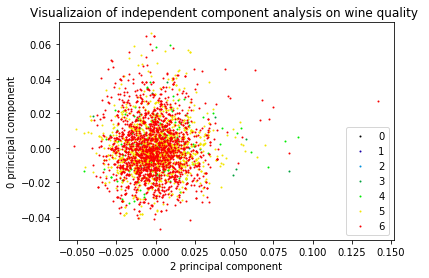

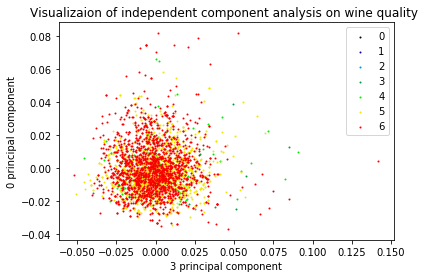

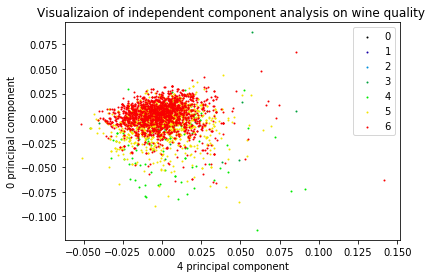

...

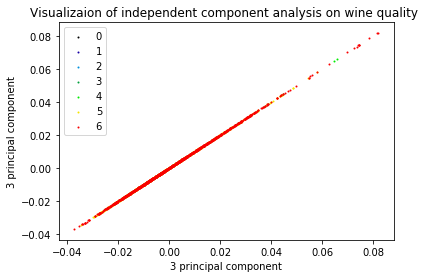

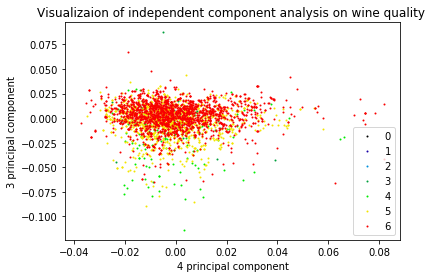

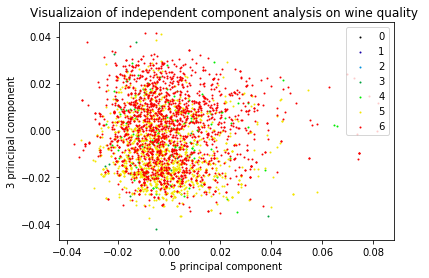

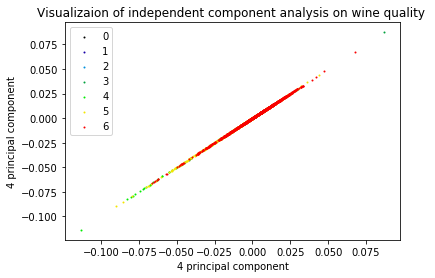

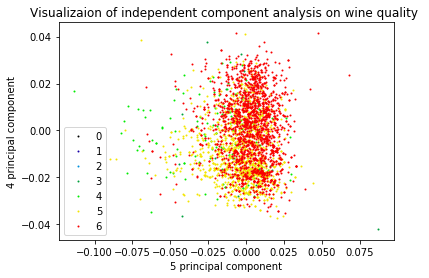

num of components: 7 reconstruction loss: 0.3160064901949658 kurtosis: 2.33323349562


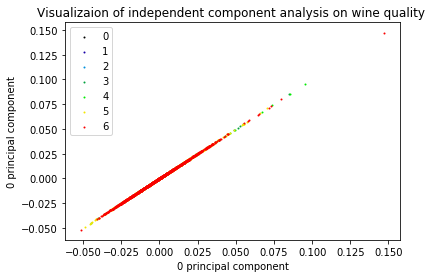

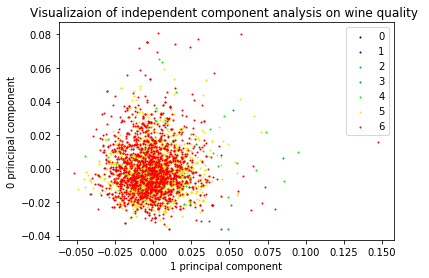

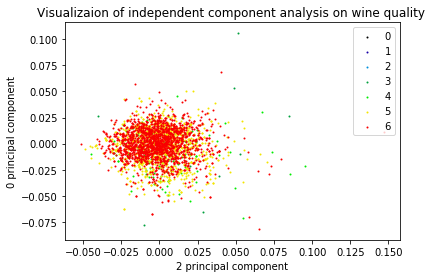

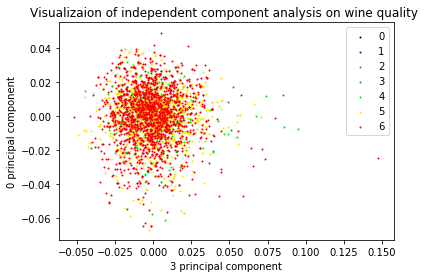

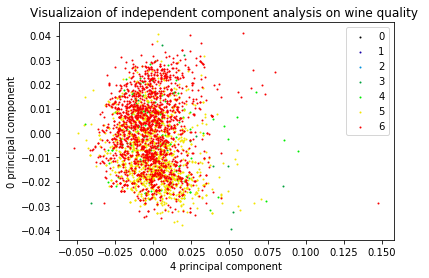

...

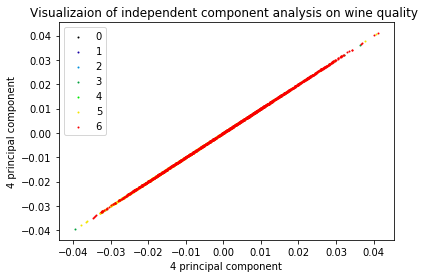

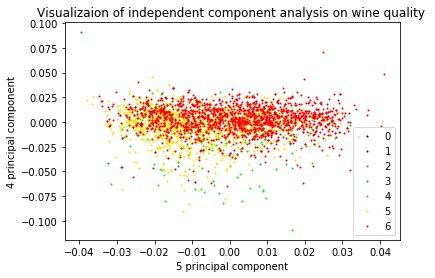

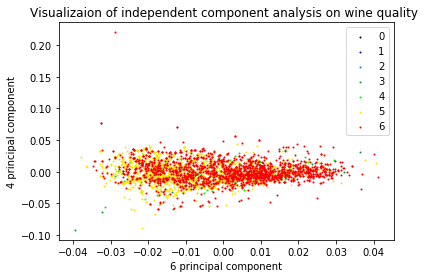

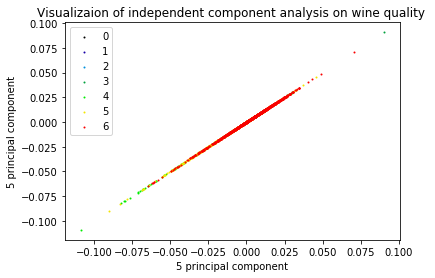

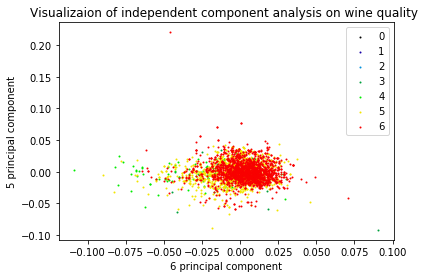

num of components: 8 reconstruction loss: 0.16784397291499004 kurtosis: 2.49123265167


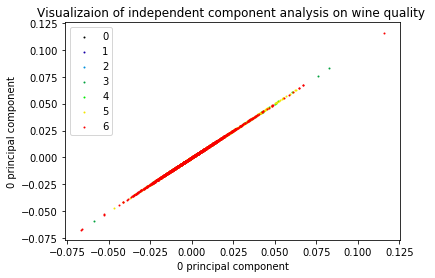

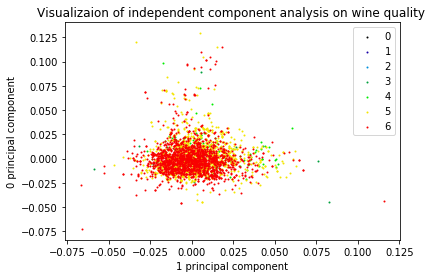

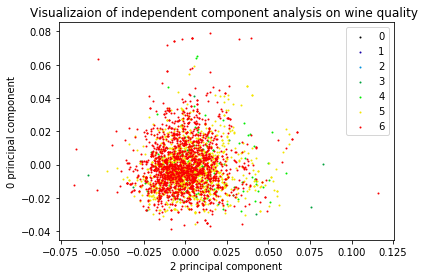

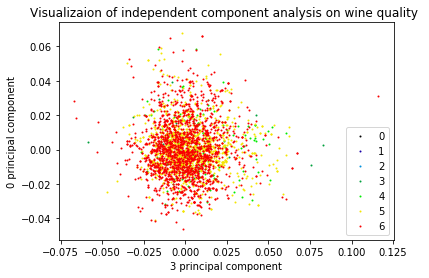

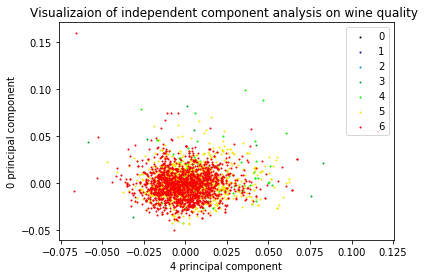

...

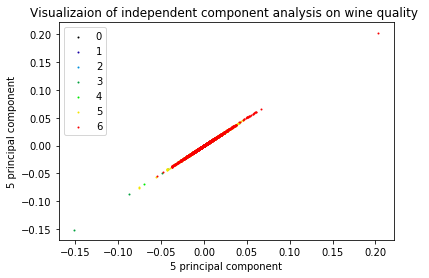

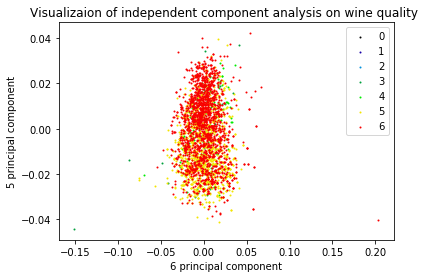

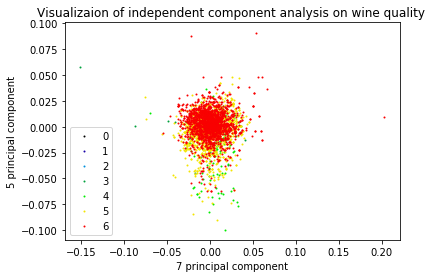

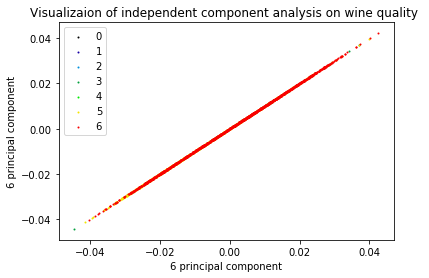

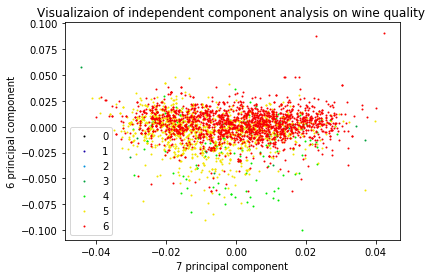

num of components: 9 reconstruction loss: 0.06294352294443634 kurtosis: 2.68638605237


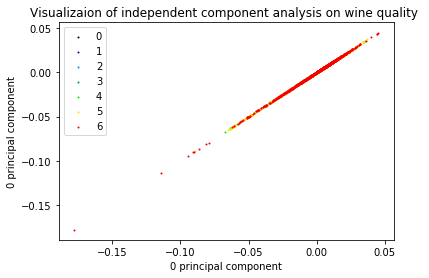

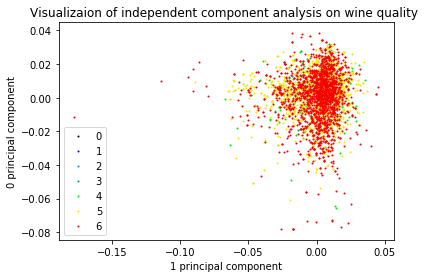

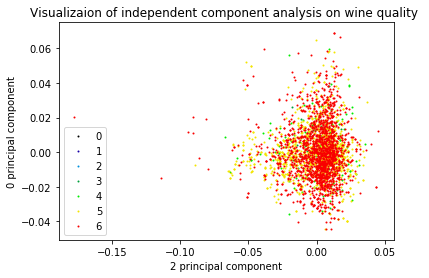

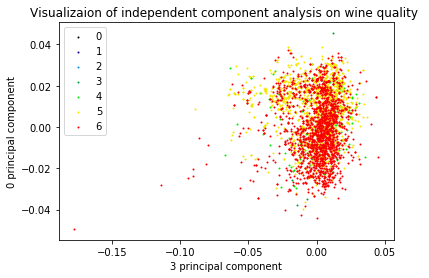

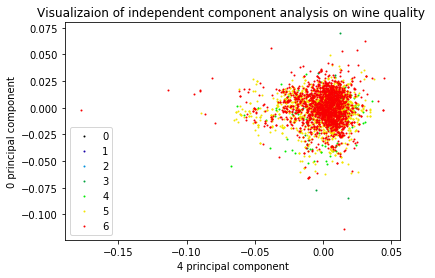

...

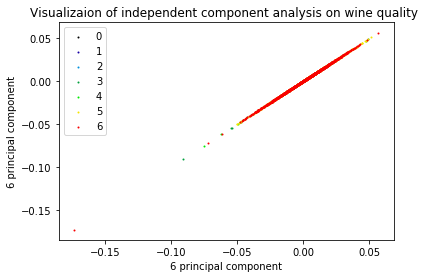

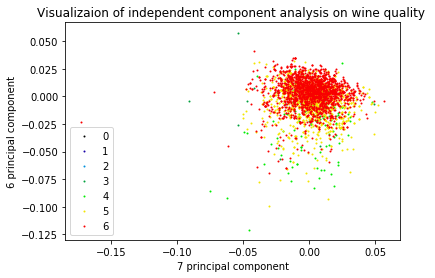

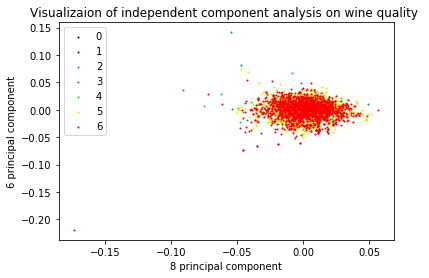

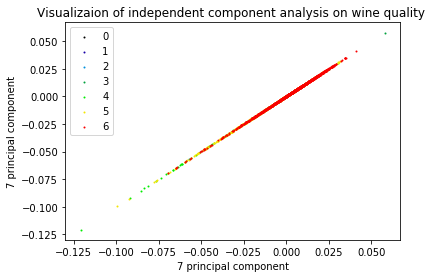

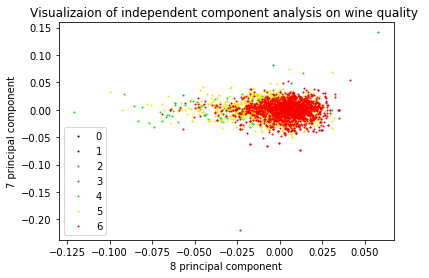

num of components: 10 reconstruction loss: 0.0035844947808928536 kurtosis: 2.78738562585


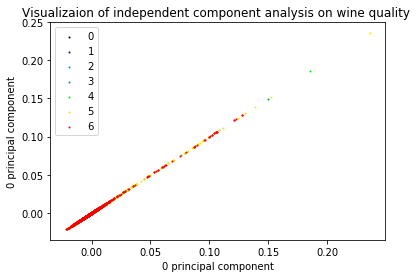

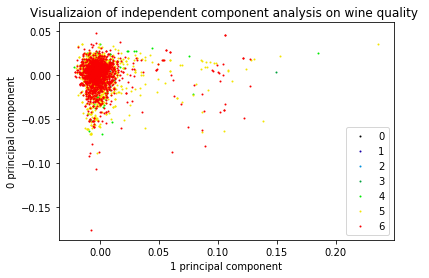

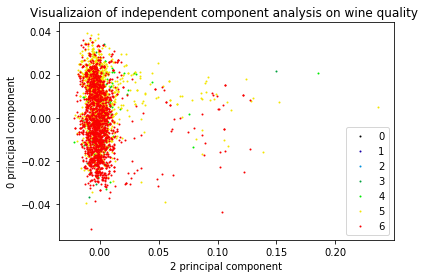

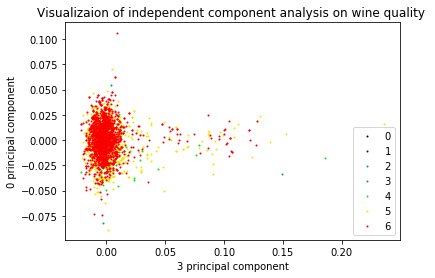

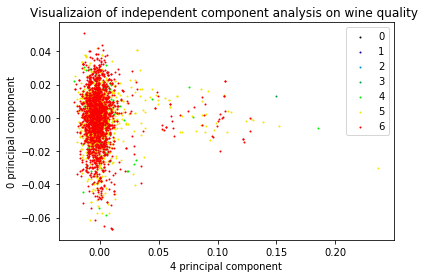

...

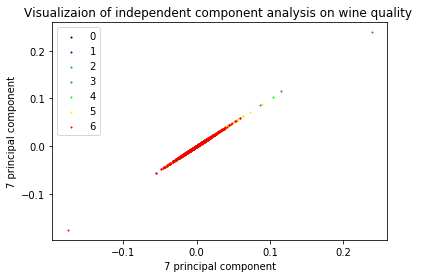

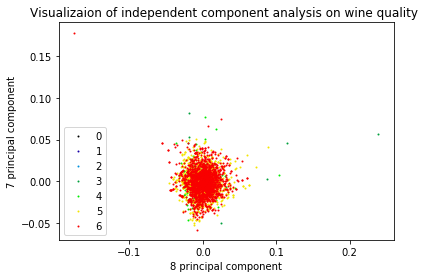

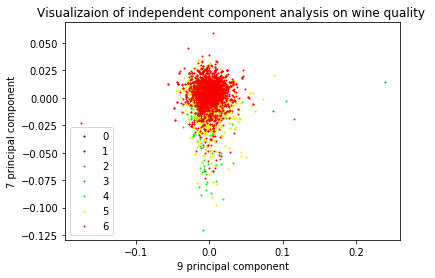

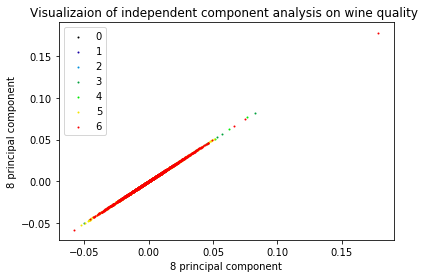

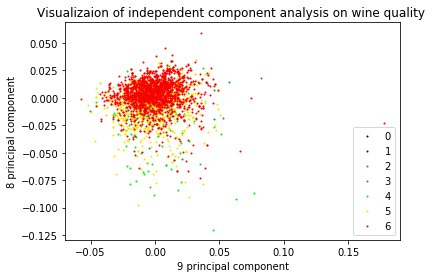

In [100]:
for num_components in range(3,11):
    ica = ICA(n_components=num_components)
    X_r = ica.fit(X).transform(X)
    loss = ((X-ica.inverse_transform(X_r))**2).mean().mean()
    k = kurtosis(X_r, axis=1, fisher=False).mean()
    print("num of components: %s reconstruction loss: %s kurtosis: %s"%(num_components,loss,k))
    #print(pca.explained_variance_)
    visialize_ICA(X_r,num_components)

## Randomized Projection

In [6]:
from sklearn.random_projection import GaussianRandomProjection as RP
from sklearn.utils.extmath import safe_sparse_dot as ssd

In [103]:
def visialize_RP(X_r,noc):
    plt.figure()
    colors = [cm.spectral(float(i) / 7) for i in range(7)]
    lw = 2
    for m in range(0,noc - 1):
        for n in range(m,noc):
            for color, i in zip(colors, [i for i in range (7)]):
                plt.scatter(X_r[y == i, m], X_r[y == i, n], color=color, s=1,
                            label=i)
                plt.xlabel('%s principal component'%(n))
                plt.ylabel('%s principal component'%(m))
                plt.title('Visualizaion of randomized projection on wine quality ')
            plt.legend(scatterpoints=1)
            plt.savefig('./figures/wine/RP/noc=%s_%s_%s.png'%(noc,m,n))
            plt.show()

num of components: 3 reconstruction loss: 23.4940260098 loss variance: 9.39778375138


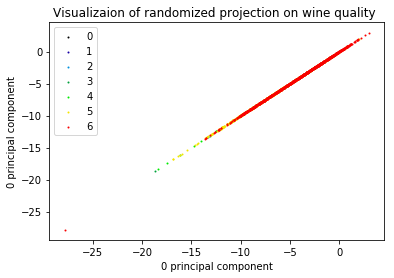

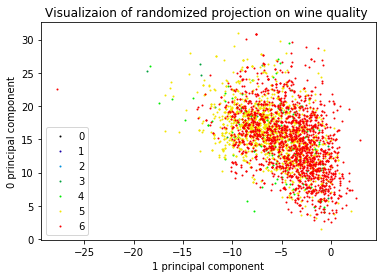

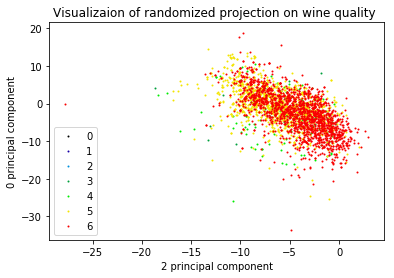

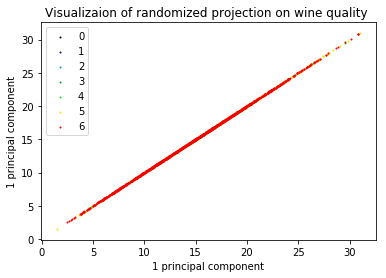

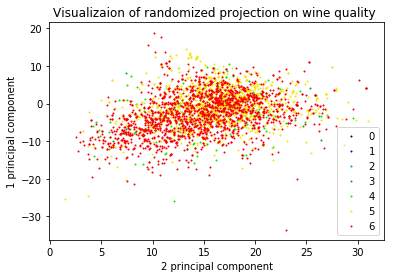

num of components: 4 reconstruction loss: 21.944980767 loss variance: 13.5473717932


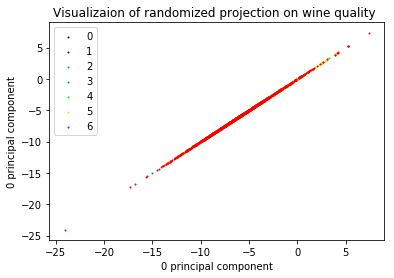

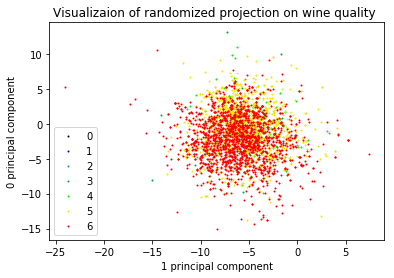

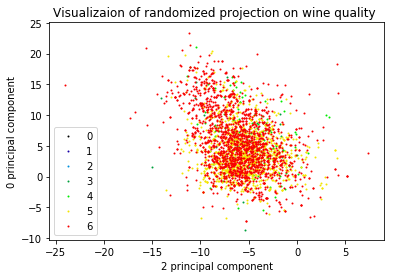

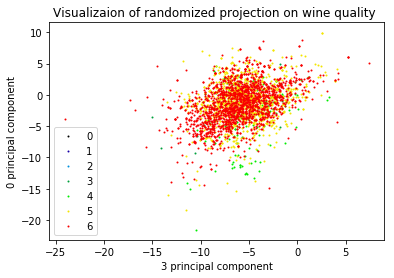

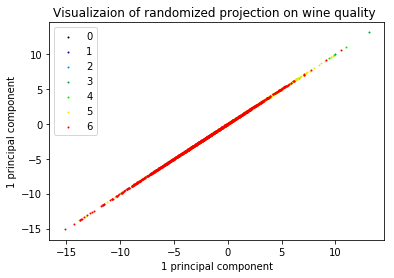

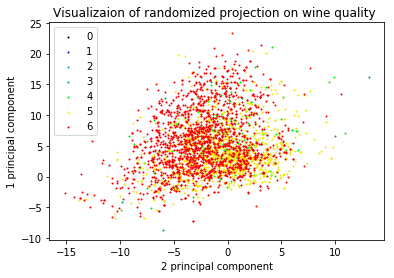

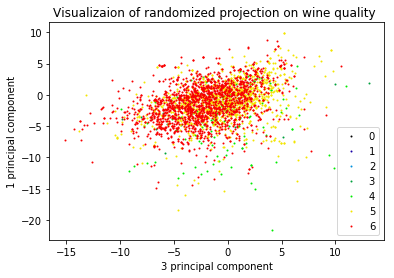

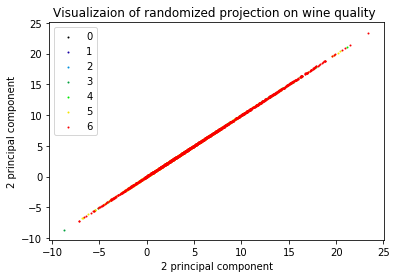

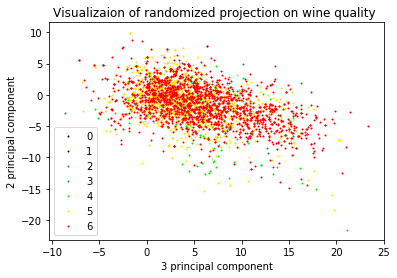

num of components: 5 reconstruction loss: 19.641563882 loss variance: 39.7932704259


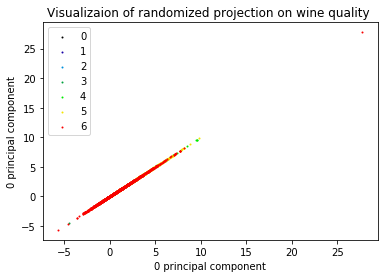

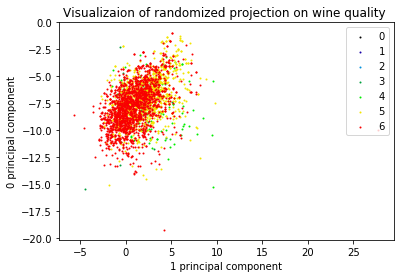

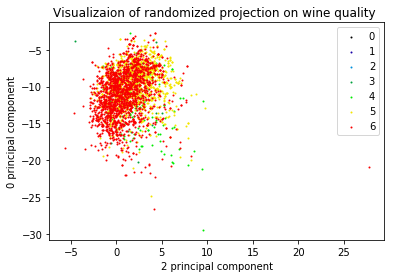

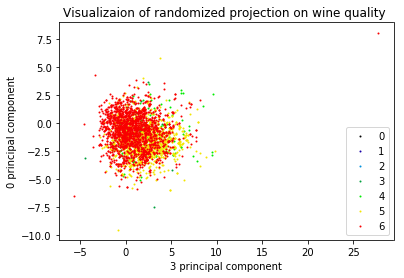

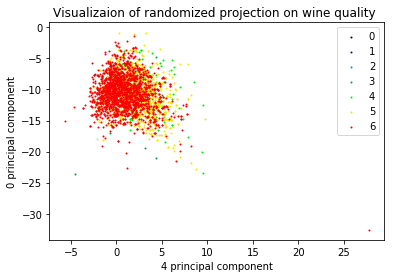

...

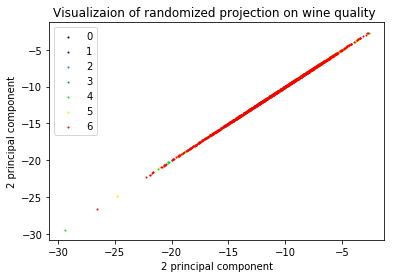

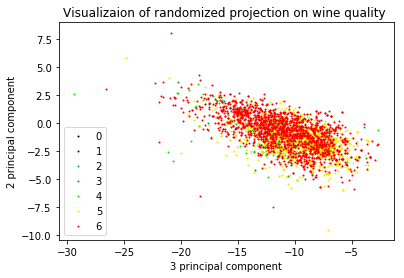

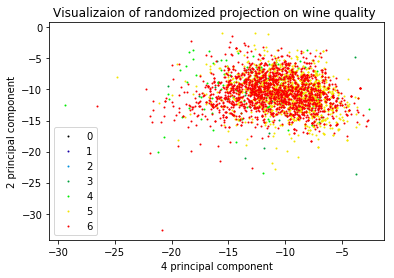

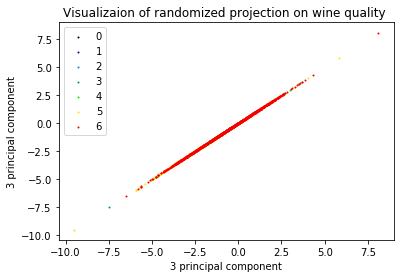

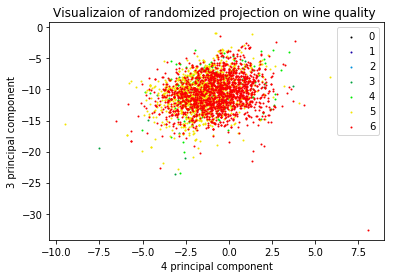

num of components: 6 reconstruction loss: 13.7763403716 loss variance: 23.778620019


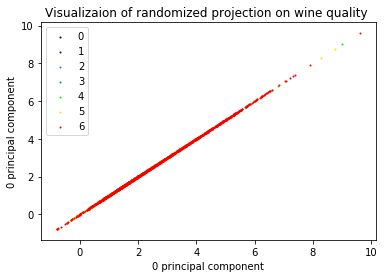

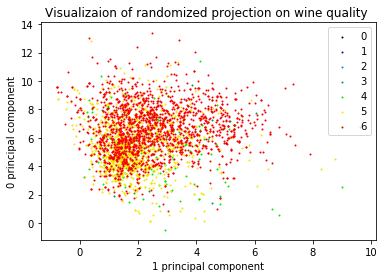

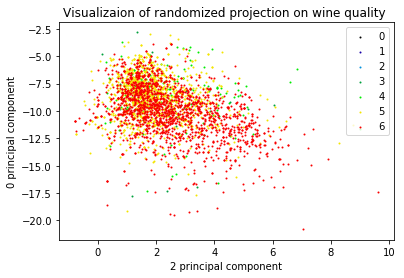

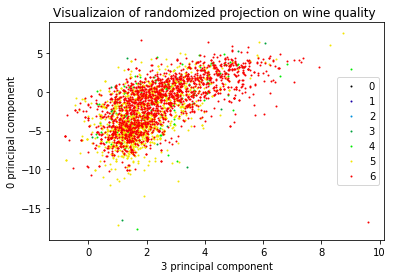

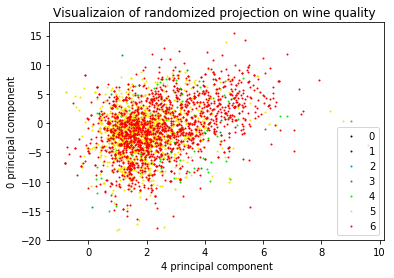

...

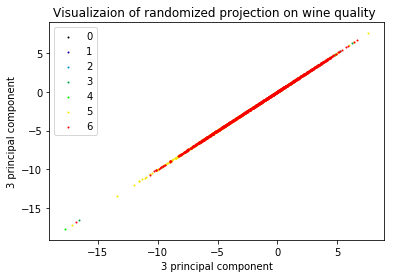

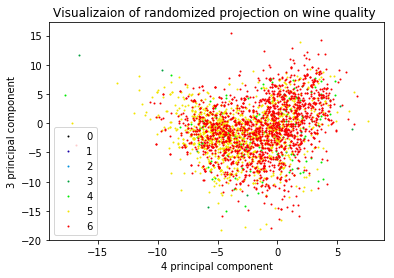

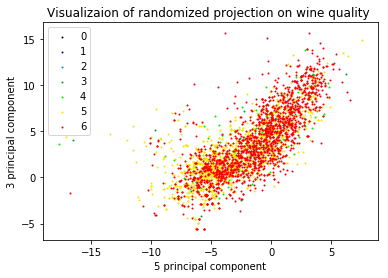

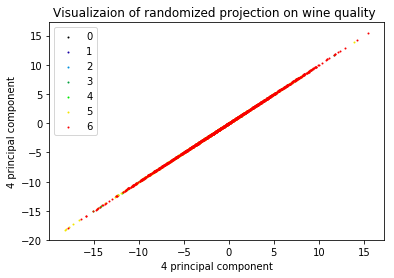

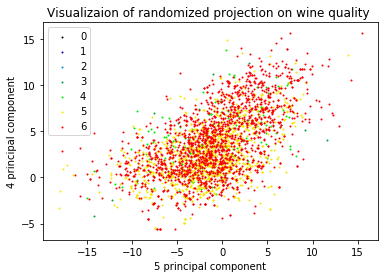

num of components: 7 reconstruction loss: 11.5038892557 loss variance: 27.9299526757


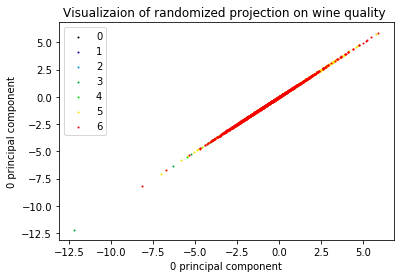

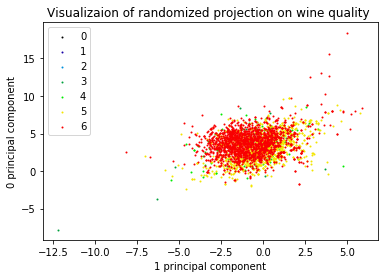

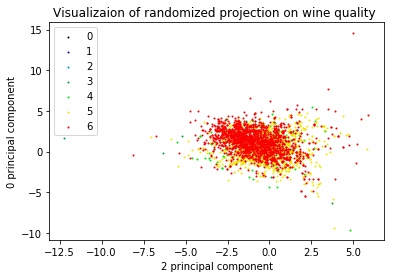

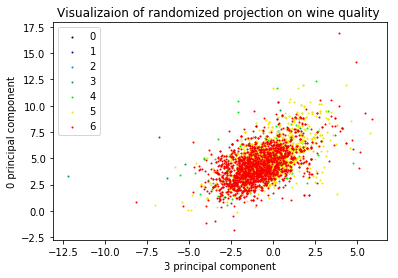

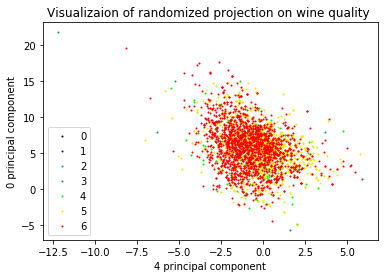

...

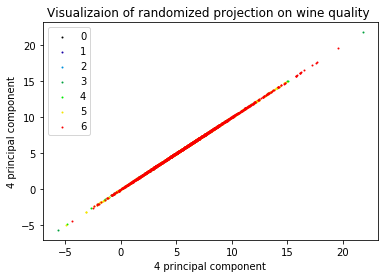

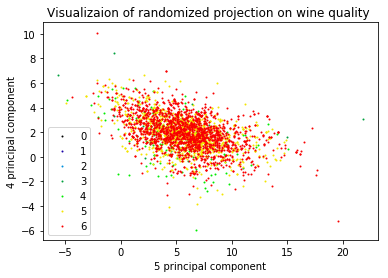

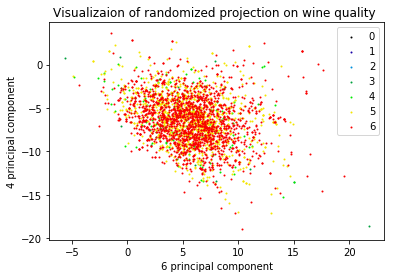

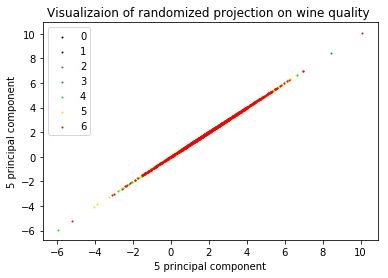

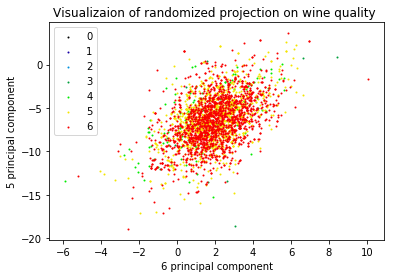

num of components: 8 reconstruction loss: 6.95268378199 loss variance: 6.12466399819


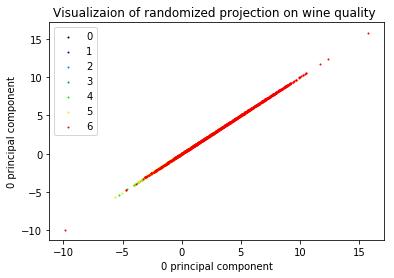

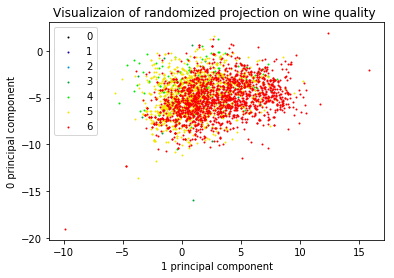

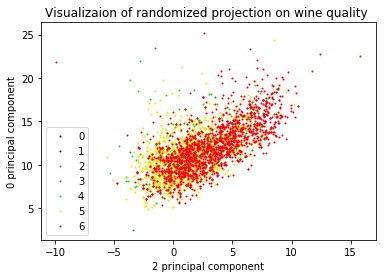

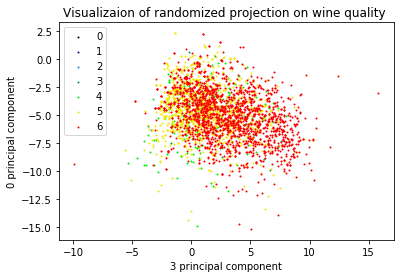

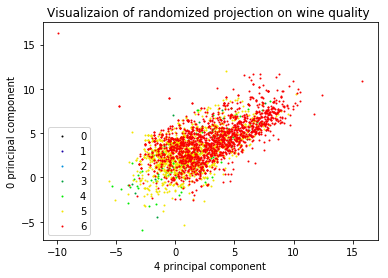

...

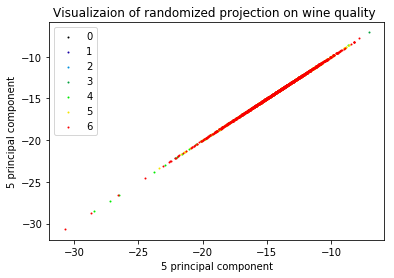

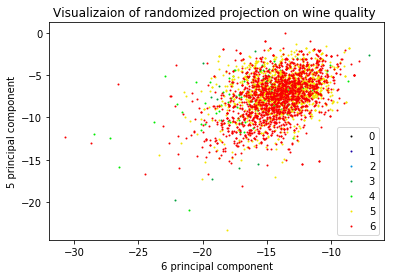

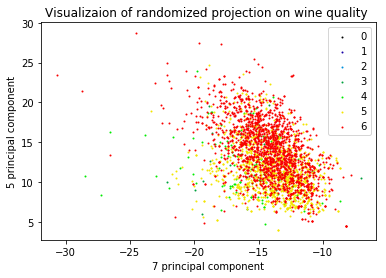

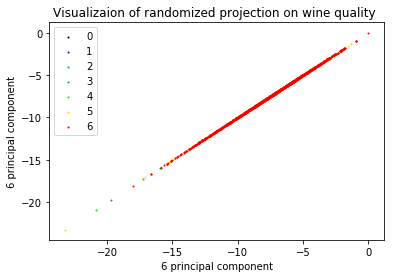

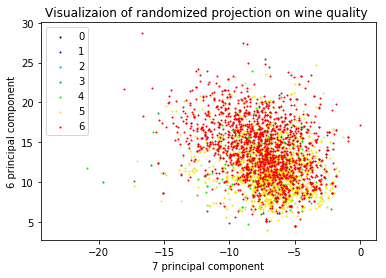

num of components: 9 reconstruction loss: 4.61713750056 loss variance: 10.9273000439


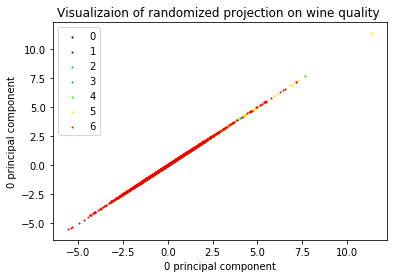

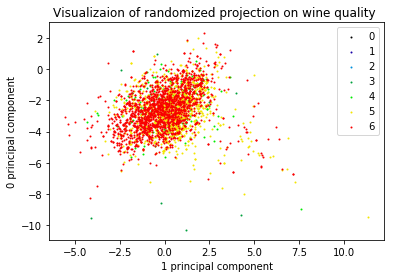

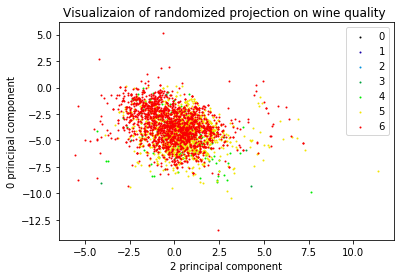

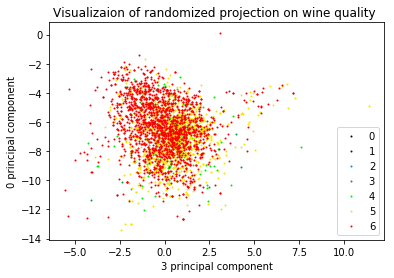

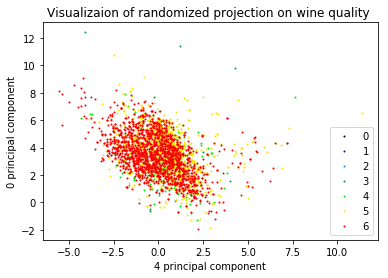

...

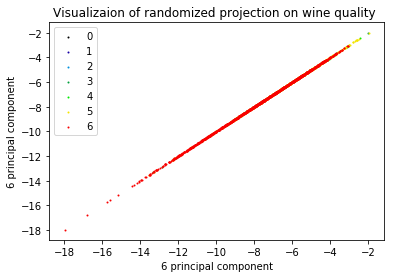

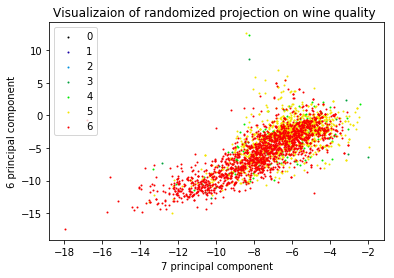

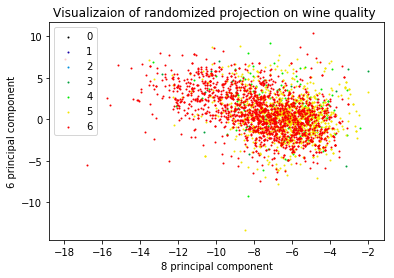

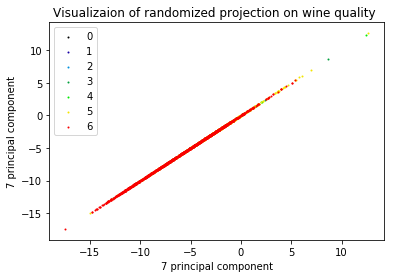

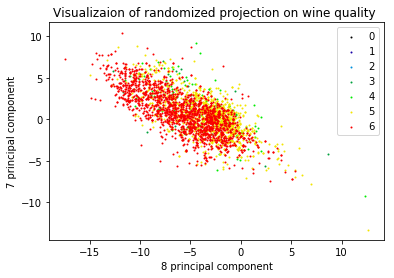

num of components: 10 reconstruction loss: 5.67841158294 loss variance: 11.5189343564


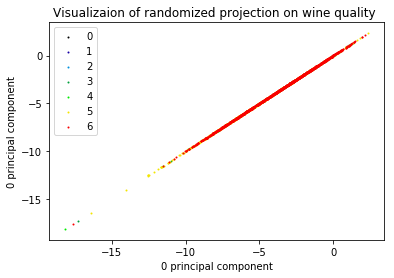

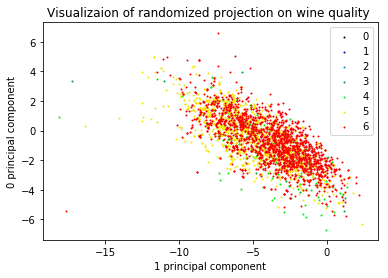

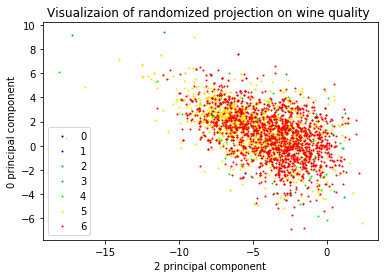

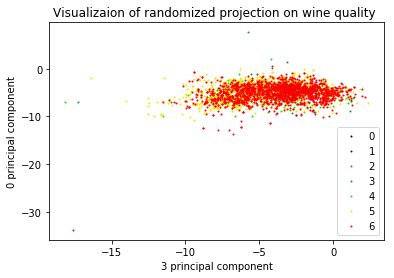

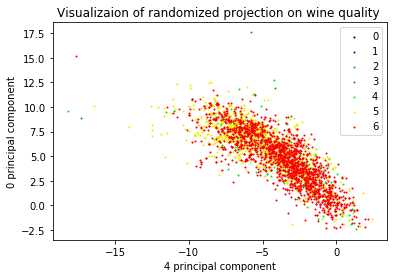

...

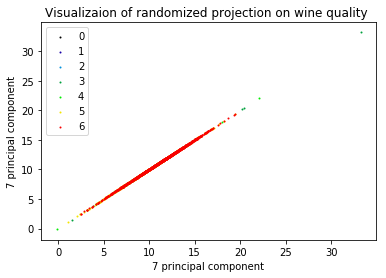

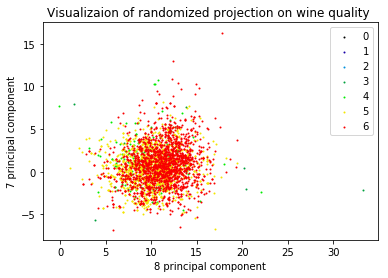

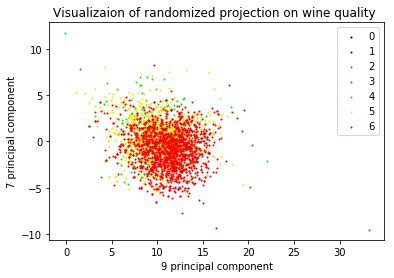

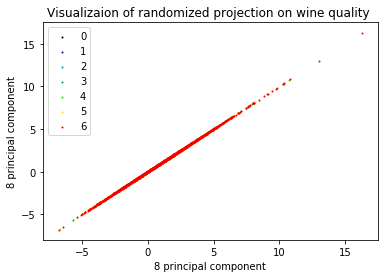

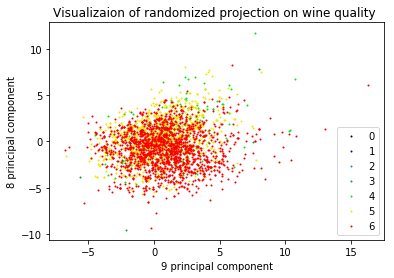

In [104]:
for num_components in range(3,11):
    loss_list = list()
    for i in range(13 - num_components):
        rp = RP(n_components=num_components)
        X_r = rp.fit(X).transform(X)
        loss = ((X-ssd(X_r, np.linalg.pinv(rp.components_).T))**2).mean().mean()
        loss_list.append(loss)
    print("num of components: %s reconstruction loss: %s loss variance: %s"%(num_components,np.mean(loss_list),np.var(loss_list)))
    visialize_RP(X_r,num_components)

## LinearDiscriminantAnalysis

Results of randomized projections on wine quality data
time	accuracy
0.00s	0.531


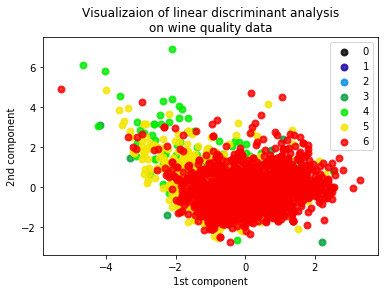

In [112]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
def LDA_analysis(X, y, n, target_names, data_name):
    
    print('Results of randomized projections on %s data' % data_name)
    print('time\taccuracy')
      
    lda = LDA()
    t0 = time()
    X_r = lda.fit(X, y).transform(X)
    print('%.2fs\t%.3f'
              % (time()-t0, lda.score(X, y)))
        
    plt.figure()
    colors = [cm.spectral(float(i) / n) for i in range(n)]
    lw = 2

    for color, i, target_name in zip(colors, [i for i in range (n)], target_names):
            plt.scatter(X_r[y == i, 0], X_r[y == i, 1], color=color, alpha=.8, lw=lw,
                        label=target_name)
    plt.xlabel('1st component')
    plt.ylabel('2nd component')
    plt.title('Visualizaion of linear discriminant analysis\non %s data' % data_name)
    plt.legend(loc='best', shadow=False, scatterpoints=1)
    plt.show()
    

LDA_analysis(X,y,7,[0,1,2,3,4,5,6],'wine quality')

# Cluster on the transformed data

In [113]:
def PCA_transform(x_train, y_train, x_test=None, y_test=None):
    clf = PCA(n_components = 8).fit(x_train, y_train)
    x_train_pca = clf.transform(x_train)
    if y_test is not None:
        x_test_pca = clf.transform(x_test)
    else:
        x_test_pca = None
    return x_train_pca, y_train, x_test_pca, y_test

def ICA_transform(x_train, y_train, x_test=None, y_test=None):
    clf = ICA(n_components = 8).fit(x_train, y_train)
    x_train_ica = clf.transform(x_train)
    if y_test is not None:
        x_test_ica = clf.transform(x_test)
    else:
        x_test_ica = None
    return x_train_ica, y_train, x_test_ica, y_test

def RP_transform(x_train, y_train, x_test=None, y_test=None):
    clf = RP(n_components = 8).fit(x_train, y_train)
    x_train_rp = clf.transform(x_train)
    if y_test is not None:
        x_test_rp = clf.transform(x_test)
    else:
        x_test_rp = None
    return x_train_rp, y_train, x_test_rp, y_test

def LDA_transform(x_train, y_train, x_test=None, y_test=None):
    clf = LDA(n_components = 8).fit(x_train, y_train)
    x_train_lda = clf.transform(x_train)
    if y_test is not None:
        x_test_lda = clf.transform(x_test)
    else:
        x_test_lda = None
    return x_train_lda, y_train, x_test_lda, y_test

In [114]:
X_PCA,y_PCA,_,_ = PCA_transform(X,y)
X_ICA,y_ICA,_,_ = ICA_transform(X,y)
X_RP,y_RP,_,_ = RP_transform(X,y)
X_LDA,y_LDA,_,_ = LDA_transform(X,y)

In [121]:
def km(X_test,y,ss,m):
    range_n_clusters = [8]
    for n_clusters in range_n_clusters:
        fig = plt.gcf()
        fig.set_size_inches(7, 7)
        ax = fig.add_subplot(111)
        t0 = time()
        clusterer = KMeans(n_clusters=n_clusters, random_state=10).fit(X_test)
        cluster_labels = clusterer.labels_
        print("time: ",time()-t0)
        silhouette_avg = silhouette_score(X_test, cluster_labels)
        print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)
        print("The NMI score is: %.6f" % normalized_mutual_info_score(y, cluster_labels))
    
        colors = cm.spectral(cluster_labels.astype(float) / n_clusters)
        ax.scatter( X_test[:, 0], X_test[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

        centers = clusterer.cluster_centers_

        ax.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

        for i, c in enumerate(centers):
            ax.scatter( c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

        ax.set_title("The visualization of the clustered data.")
        ax.set_xlabel("Feature space for the 1st feature")
        ax.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(("KMeans using %s "
                  "n_clusters = %d" %(m, n_clusters)),
                 fontsize=14, fontweight='bold')
        plt.savefig('./figures/wine/%s/k= %s.png'%(ss,n_clusters))
        plt.show()

def em(X_test,y,ss,m):
    range_n_clusters = [8]
    for n_clusters in range_n_clusters:
        fig = plt.gcf()
        fig.set_size_inches(7, 7)
        ax = fig.add_subplot(111)
        t0 = time()
        clusterer = EM(n_components=n_clusters, random_state=10).fit(X_test)
        cluster_labels = clusterer.predict(X_test)
        print("time: ",time()-t0)
        silhouette_avg = silhouette_score(X_test, cluster_labels)
        print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)
        print("The NMI score is: %.6f" % normalized_mutual_info_score(y, cluster_labels))
    
        colors = cm.spectral(cluster_labels.astype(float) / n_clusters)
        ax.scatter( X_test[:, 0], X_test[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

        centers = clusterer.means_

        ax.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

        for i, c in enumerate(centers):
            ax.scatter( c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

        ax.set_title("The visualization of the clustered data.")
        ax.set_xlabel("Feature space for the 1st feature")
        ax.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(("EM using %s  "
                  "n_clusters = %d" %(m, n_clusters)),
                 fontsize=14, fontweight='bold')
        plt.savefig('./figures/wine/%s/k= %s.png'%(ss,n_clusters))
        plt.show()

time:  0.16666173934936523
For n_clusters = 8 The average silhouette_score is : 0.0298883115047
The NMI score is: 0.071812


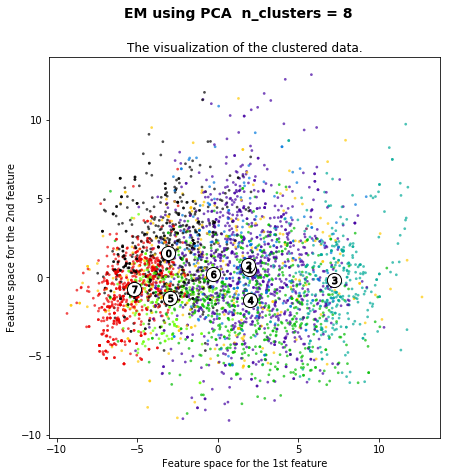

time:  0.16260862350463867
For n_clusters = 8 The average silhouette_score is : 0.0457508204177
The NMI score is: 0.072326


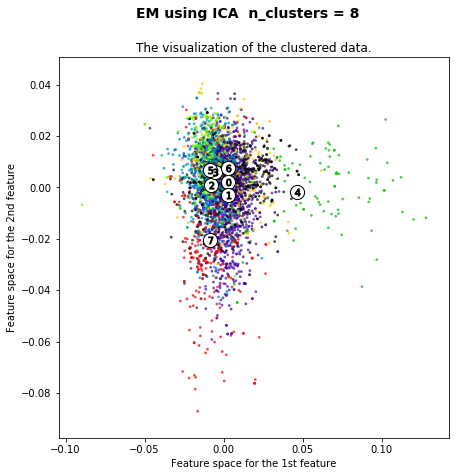

time:  0.3202943801879883
For n_clusters = 8 The average silhouette_score is : 0.0198092519934
The NMI score is: 0.068835


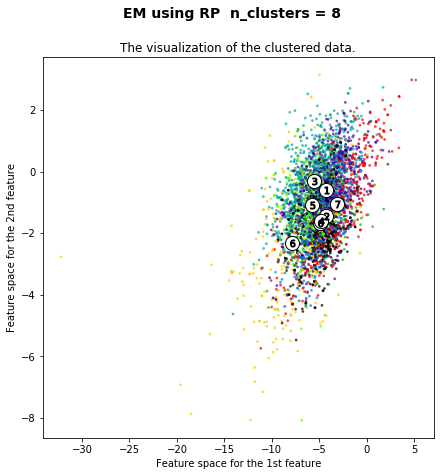

time:  0.23149466514587402
For n_clusters = 8 The average silhouette_score is : 0.0886984229858
The NMI score is: 0.093552


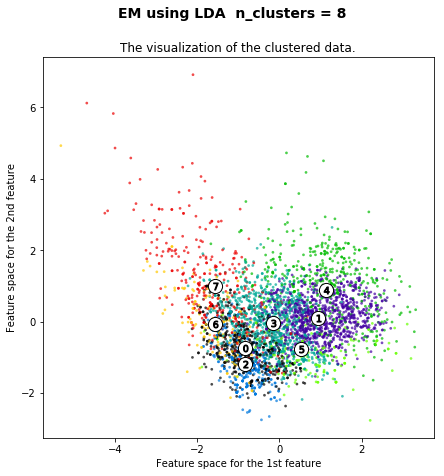

time:  0.37570643424987793
For n_clusters = 8 The average silhouette_score is : 0.151339502009
The NMI score is: 0.089499


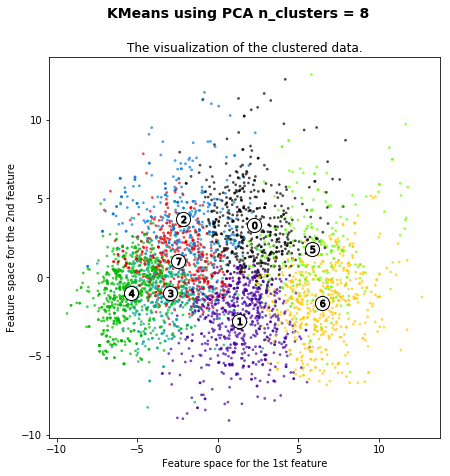

time:  0.32022643089294434
For n_clusters = 8 The average silhouette_score is : 0.131201107958
The NMI score is: 0.086964


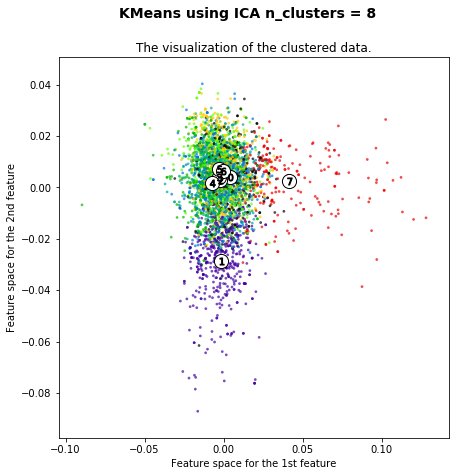

time:  0.5151426792144775
For n_clusters = 8 The average silhouette_score is : 0.197390376974
The NMI score is: 0.068912


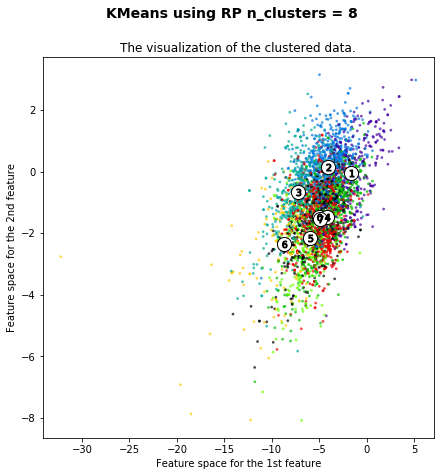

time:  0.39621472358703613
For n_clusters = 8 The average silhouette_score is : 0.151032151421
The NMI score is: 0.097818


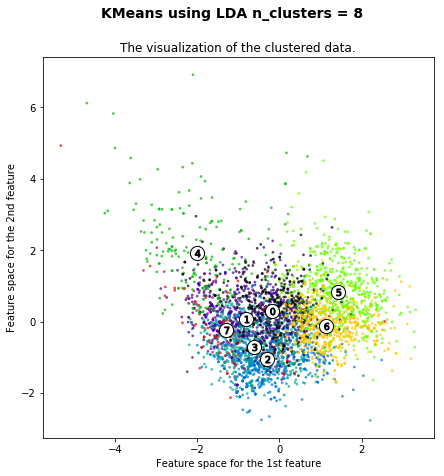

In [122]:
em(X_PCA,y_PCA,"EM_PCA","PCA")
em(X_ICA,y_ICA,"EM_ICA","ICA")
em(X_RP,y_RP,"EM_RP","RP")
em(X_LDA,y_LDA,"EM_LDA","LDA")

km(X_PCA,y_PCA,'kmeans_PCA',"PCA")
km(X_ICA,y_ICA,'kmeans_ICA',"ICA")
km(X_RP,y_RP,'kmeans_RP',"RP")
km(X_LDA,y_LDA,"kmeans_LDA","LDA")

# ANN on the new projected data

In [154]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from time import time
def neural_network(hidden_layer_sizes):
    return MLPClassifier(solver='lbfgs', max_iter = 1000, activation = 'relu', alpha=1e-5, hidden_layer_sizes = hidden_layer_sizes, random_state=1)

def neural_network_training(X,y,dataname1,ss,drname):
    x_train, x_test, y_train, y_test = train_test_split(X, y, random_state=0, test_size=0.3)
    t0 = time()
    hidden_layer_sizes = [(4,),(8,),(16,),(4,4),(8,8),(16,16),(4,4,4),(8,8,8),(16,16,16),(4,4,4,4),(8,8,8,8),(4,4,4,8,8),(4,4,4,4,4,4),(4,4,4,4,4,4,4),(4,4,4,4,4,4,4,4)]
    train_err = []
    structure = []
    for i in range(len(hidden_layer_sizes)):
        train_err.append(0)
        structure.append(i+1)
        clf = neural_network(hidden_layer_sizes[i])
        train_err[i] = 1-cross_val_score(clf, x_train, y_train, cv=5).mean()
#         print('training error:',train_err[i])
        
    print('Best structure:', hidden_layer_sizes[np.argmin(train_err)])
    print('Total time:', int(time()-t0), 's')
    plt.figure()
    plt.title('Neural Networks Algorithm for '+dataname1+' Dataset'+'\n'+'after '+drname+' with Different Network Structures')
    plt.plot(structure, train_err, 'o-', color="r",label="Cross-validation score")
    plt.legend()
    plt.xlabel('Structure Number of Neural Network')
    plt.ylabel('Error Rate')
    plt.savefig("./figures/wine/neural_network/%s.jpg"%(ss))
    plt.show()
    return hidden_layer_sizes[np.argmin(train_err)]


In [155]:
def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None,
                        n_jobs=1, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    plt.savefig("./figures/wine/neural_network/%s.jpg"%(title))
    plt.show()
    return plt

/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 membe

Best structure: (8,)
Total time: 164 s


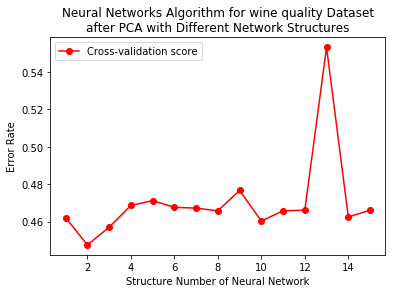

Best accuracy: 0.534013605442


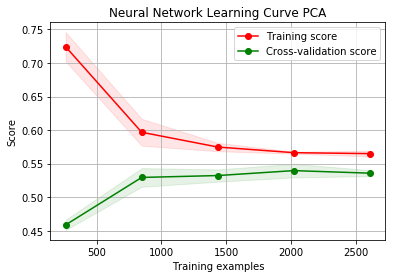

<module 'matplotlib.pyplot' from '/home/jimmy/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py'>

In [156]:
best_size =  neural_network_training(X_PCA,y_PCA,'wine quality',"PCA","PCA")
x_train, x_test, y_train, y_test = train_test_split(X_PCA, y_PCA, random_state=0, test_size=0.3)
print('Best accuracy:', neural_network(best_size).fit(x_train, y_train).score(x_test, y_test))
plot_learning_curve(neural_network(best_size),'Neural Network Learning Curve PCA',X_PCA,y_PCA)

/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 membe

Best structure: (16, 16, 16)
Total time: 79 s


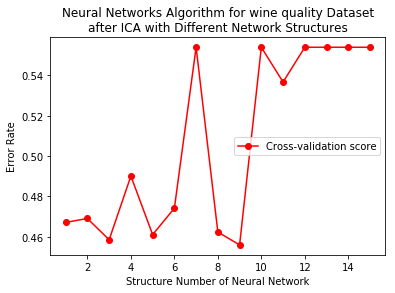

Best accuracy: 0.559948979592


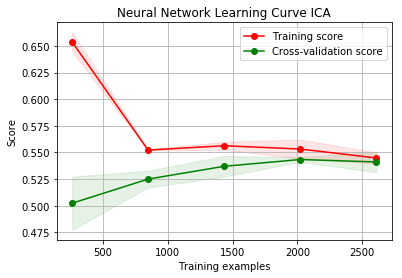

<module 'matplotlib.pyplot' from '/home/jimmy/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py'>

In [145]:
best_size =  neural_network_training(X_ICA,y_ICA,'wine quality',"ICA","ICA")
x_train, x_test, y_train, y_test = train_test_split(X_ICA, y_ICA, random_state=0, test_size=0.3)
print('Best accuracy:', neural_network(best_size).fit(x_train, y_train).score(x_test, y_test))
plot_learning_curve(neural_network(best_size),'Neural Network Learning Curve ICA',X_ICA,y_ICA)

/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 membe

Best structure: (16, 16, 16)
Total time: 109 s


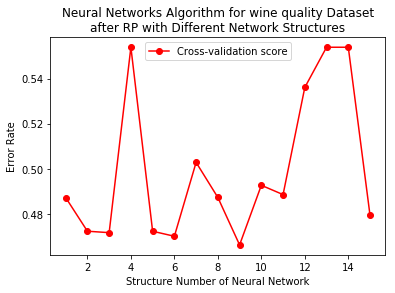

Best accuracy: 0.55612244898


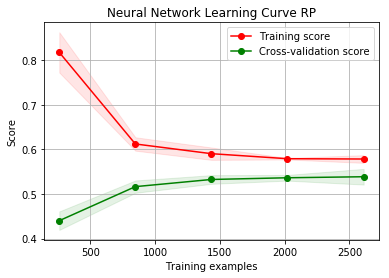

<module 'matplotlib.pyplot' from '/home/jimmy/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py'>

In [146]:
best_size =  neural_network_training(X_RP,y_RP,'wine quality',"RP","RP")
x_train, x_test, y_train, y_test = train_test_split(X_RP, y_RP, random_state=0, test_size=0.3)
print('Best accuracy:', neural_network(best_size).fit(x_train, y_train).score(x_test, y_test))
plot_learning_curve(neural_network(best_size),'Neural Network Learning Curve RP',X_RP,y_RP)

/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 membe

Best structure: (4, 4)
Total time: 156 s


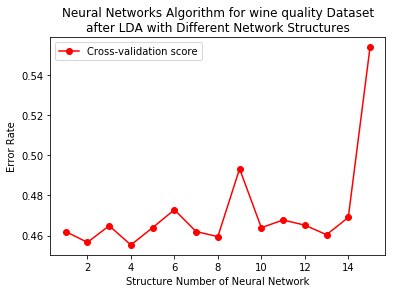

Best accuracy: 0.545918367347


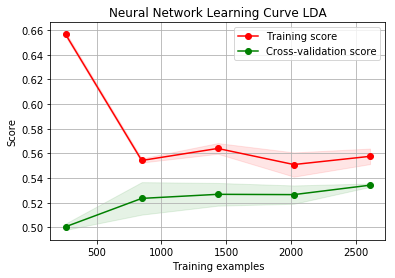

<module 'matplotlib.pyplot' from '/home/jimmy/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py'>

In [147]:
best_size =  neural_network_training(X_LDA,y_LDA,'wine quality',"LDA","LDA")
x_train, x_test, y_train, y_test = train_test_split(X_LDA, y_LDA, random_state=0, test_size=0.3)
print('Best accuracy:', neural_network(best_size).fit(x_train, y_train).score(x_test, y_test))
plot_learning_curve(neural_network(best_size),'Neural Network Learning Curve LDA',X_LDA,y_LDA)

/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 membe

Best structure: (16,)
Total time: 93 s


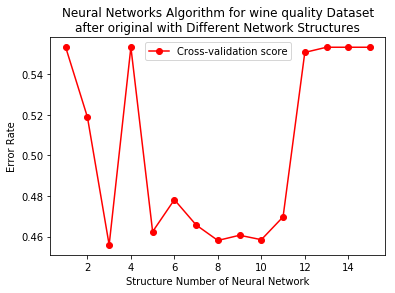

Best accuracy: 0.553571428571


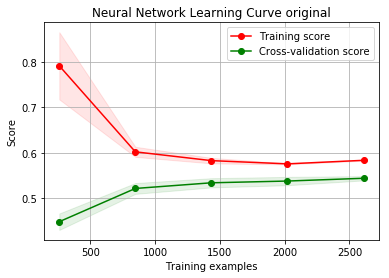

<module 'matplotlib.pyplot' from '/home/jimmy/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py'>

In [157]:
best_size =  neural_network_training(X,y,'wine quality',"original","original")
x_train, x_test, y_train, y_test = train_test_split(X, y, random_state=0, test_size=0.3)
print('Best accuracy:', neural_network(best_size).fit(x_train, y_train).score(x_test, y_test))
plot_learning_curve(neural_network(best_size),'Neural Network Learning Curve original',X,y)

# Neural network with clusters

In [179]:
def KMeans_transform(x_train, y_train, x_test, y_test,  n):
    clusterer = KMeans(n_clusters=n, random_state=10).fit(x_train)
    x_train_kmeans = clusterer.predict(x_train)
    x_test_kmeans = clusterer.predict(x_test)
    a = np.column_stack((x_train, x_train_kmeans))
    return np.column_stack((x_train, x_train_kmeans)), y_train, np.column_stack((x_test, x_test_kmeans)), y_test
    
def EM_transform(x_train, y_train, x_test, y_test,  n):
    clusterer = EM(n_components=n, random_state=10).fit(x_train)
    x_train_kmeans = clusterer.predict(x_train)
    x_test_kmeans = clusterer.predict(x_test)
    return np.column_stack((x_train, x_train_kmeans)), y_train, np.column_stack((x_test, x_test_kmeans)), y_test

def neural_network_training(x_train, y_train,x_test, y_test,dataname1,ss,drname):
    t0 = time()
    hidden_layer_sizes = [(4,),(8,),(16,),(4,4),(8,8),(16,16),(4,4,4),(8,8,8),(16,16,16),(4,4,4,4),(8,8,8,8),(4,4,4,8,8),(4,4,4,4,4,4),(4,4,4,4,4,4,4),(4,4,4,4,4,4,4,4)]
    train_err = []
    structure = []
    for i in range(len(hidden_layer_sizes)):
        train_err.append(0)
        structure.append(i+1)
        clf = neural_network(hidden_layer_sizes[i])
        train_err[i] = 1-cross_val_score(clf, x_train, y_train, cv=5).mean()
#         print('training error:',train_err[i])
        
    print('Best structure:', hidden_layer_sizes[np.argmin(train_err)])
    print('Total time:', int(time()-t0), 's')
    plt.figure()
    plt.title('Neural Networks Algorithm for '+dataname1+' Dataset'+'\n'+'after '+drname+' with Different Network Structures')
    plt.plot(structure, train_err, 'o-', color="r",label="Cross-validation score")
    plt.legend()
    plt.xlabel('Structure Number of Neural Network')
    plt.ylabel('Error Rate')
    plt.savefig("./figures/wine/neural_network/%s.jpg"%(ss))
    plt.show()
    return hidden_layer_sizes[np.argmin(train_err)]

/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 membe

Best structure: (8,)
Total time: 159 s


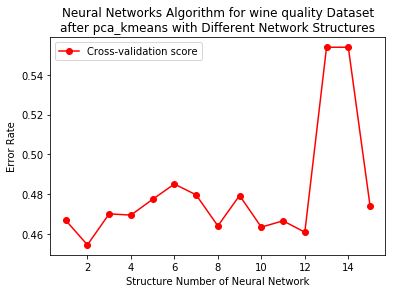

Best accuracy: 0.552295918367


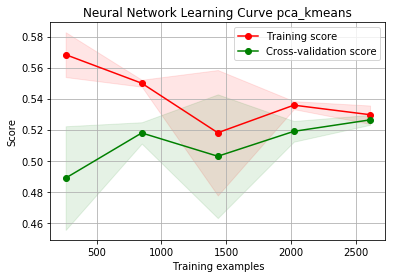

<module 'matplotlib.pyplot' from '/home/jimmy/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py'>

In [171]:
x_train, x_test, y_train, y_test = train_test_split(X, y, random_state=0, test_size=0.2)
x_train, y_train, x_test, y_test = PCA_transform(x_train, y_train, x_test, y_test)
x_train, y_train,x_test, y_test = KMeans_transform(x_train, y_train, x_test, y_test,  7)
best_size =  neural_network_training(x_train, y_train,x_test, y_test,'wine quality',"pca_kmeans","pca_kmeans")
print('Best accuracy:', neural_network(best_size).fit(x_train, y_train).score(x_test, y_test))
plot_learning_curve(neural_network(best_size),'Neural Network Learning Curve pca_kmeans',X,y)

/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 membe

Best structure: (16,)
Total time: 142 s


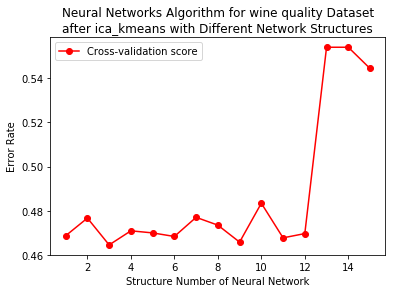

Best accuracy: 0.549744897959


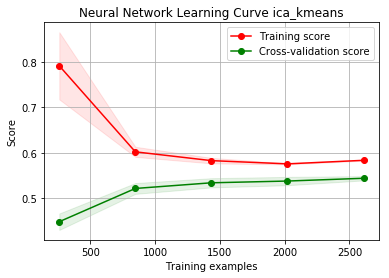

<module 'matplotlib.pyplot' from '/home/jimmy/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py'>

In [172]:
x_train, x_test, y_train, y_test = train_test_split(X, y, random_state=0, test_size=0.2)
x_train, y_train, x_test, y_test = ICA_transform(x_train, y_train, x_test, y_test)
x_train, y_train,x_test, y_test = KMeans_transform(x_train, y_train, x_test, y_test,  7)
best_size =  neural_network_training(x_train, y_train,x_test, y_test,'wine quality',"ica_kmeans","ica_kmeans")
print('Best accuracy:', neural_network(best_size).fit(x_train, y_train).score(x_test, y_test))
plot_learning_curve(neural_network(best_size),'Neural Network Learning Curve ica_kmeans',X,y)

/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 membe

Best structure: (16, 16, 16)
Total time: 102 s


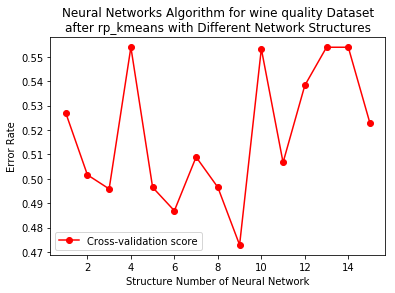

Best accuracy: 0.530612244898


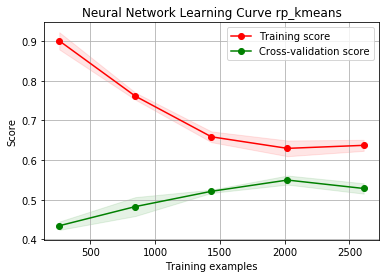

<module 'matplotlib.pyplot' from '/home/jimmy/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py'>

In [173]:
x_train, x_test, y_train, y_test = train_test_split(X, y, random_state=0, test_size=0.2)
x_train, y_train, x_test, y_test = RP_transform(x_train, y_train, x_test, y_test)
x_train, y_train,x_test, y_test = KMeans_transform(x_train, y_train, x_test, y_test,  7)
best_size =  neural_network_training(x_train, y_train,x_test, y_test,'wine quality',"rp_kmeans","rp_kmeans")
print('Best accuracy:', neural_network(best_size).fit(x_train, y_train).score(x_test, y_test))
plot_learning_curve(neural_network(best_size),'Neural Network Learning Curve rp_kmeans',X,y)

/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 membe

Best structure: (4, 4, 4, 4)
Total time: 184 s


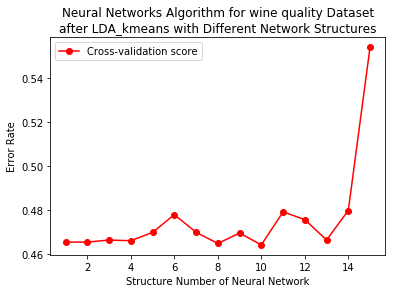

Best accuracy: 0.551020408163


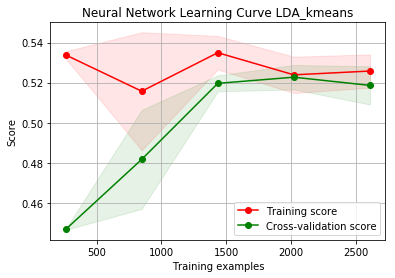

<module 'matplotlib.pyplot' from '/home/jimmy/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py'>

In [175]:
x_train, x_test, y_train, y_test = train_test_split(X, y, random_state=0, test_size=0.2)
x_train, y_train, x_test, y_test = LDA_transform(x_train, y_train, x_test, y_test)
x_train, y_train,x_test, y_test = KMeans_transform(x_train, y_train, x_test, y_test,  7)
best_size =  neural_network_training(x_train, y_train,x_test, y_test,'wine quality',"LDA_kmeans","LDA_kmeans")
print('Best accuracy:', neural_network(best_size).fit(x_train, y_train).score(x_test, y_test))
plot_learning_curve(neural_network(best_size),'Neural Network Learning Curve LDA_kmeans',X,y)

/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 membe

Best structure: (8, 8, 8)
Total time: 164 s


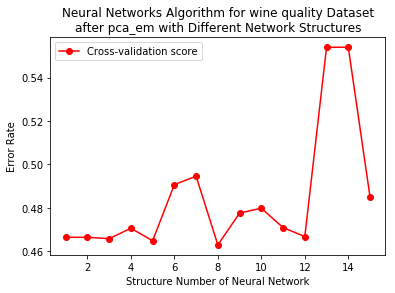

Best accuracy: 0.547193877551


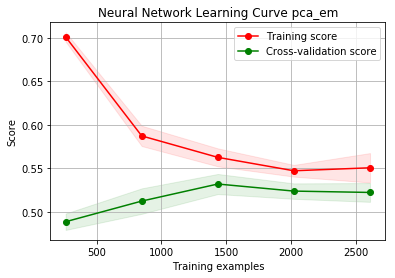

<module 'matplotlib.pyplot' from '/home/jimmy/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py'>

In [180]:
x_train, x_test, y_train, y_test = train_test_split(X, y, random_state=0, test_size=0.2)
x_train, y_train, x_test, y_test = PCA_transform(x_train, y_train, x_test, y_test)
x_train, y_train,x_test, y_test = EM_transform(x_train, y_train, x_test, y_test,  7)
best_size =  neural_network_training(x_train, y_train,x_test, y_test,'wine quality',"pca_em","pca_em")
print('Best accuracy:', neural_network(best_size).fit(x_train, y_train).score(x_test, y_test))
plot_learning_curve(neural_network(best_size),'Neural Network Learning Curve pca_em',X,y)

/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 membe

Best structure: (16,)
Total time: 151 s


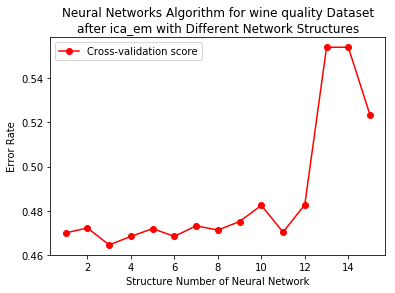

Best accuracy: 0.542091836735


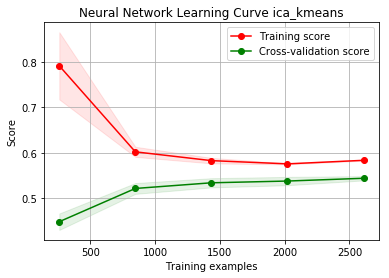

<module 'matplotlib.pyplot' from '/home/jimmy/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py'>

In [181]:
x_train, x_test, y_train, y_test = train_test_split(X, y, random_state=0, test_size=0.2)
x_train, y_train, x_test, y_test = ICA_transform(x_train, y_train, x_test, y_test)
x_train, y_train,x_test, y_test = EM_transform(x_train, y_train, x_test, y_test,  7)
best_size =  neural_network_training(x_train, y_train,x_test, y_test,'wine quality',"ica_em","ica_em")
print('Best accuracy:', neural_network(best_size).fit(x_train, y_train).score(x_test, y_test))
plot_learning_curve(neural_network(best_size),'Neural Network Learning Curve ica_kmeans',X,y)

/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 membe

Best structure: (16,)
Total time: 173 s


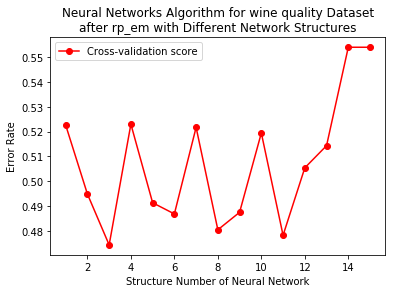

Best accuracy: 0.508928571429


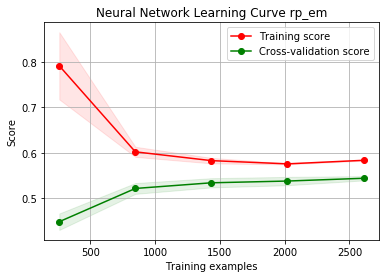

<module 'matplotlib.pyplot' from '/home/jimmy/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py'>

In [184]:
x_train, x_test, y_train, y_test = train_test_split(X, y, random_state=0, test_size=0.2)
x_train, y_train, x_test, y_test = RP_transform(x_train, y_train, x_test, y_test)
x_train, y_train,x_test, y_test = EM_transform(x_train, y_train, x_test, y_test,  7)
best_size =  neural_network_training(x_train, y_train,x_test, y_test,'wine quality',"rp_em","rp_em")
print('Best accuracy:', neural_network(best_size).fit(x_train, y_train).score(x_test, y_test))
plot_learning_curve(neural_network(best_size),'Neural Network Learning Curve rp_em',X,y)

/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)
/home/jimmy/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 4 membe

Best structure: (4, 4, 4, 8, 8)
Total time: 185 s


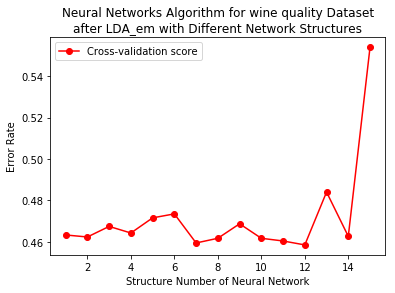

Best accuracy: 0.543367346939


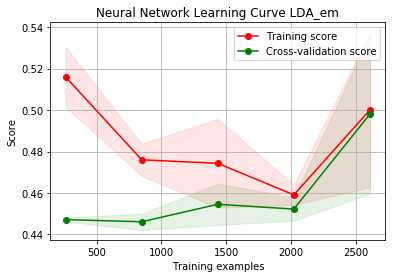

<module 'matplotlib.pyplot' from '/home/jimmy/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py'>

In [183]:
x_train, x_test, y_train, y_test = train_test_split(X, y, random_state=0, test_size=0.2)
x_train, y_train, x_test, y_test = LDA_transform(x_train, y_train, x_test, y_test)
x_train, y_train,x_test, y_test = EM_transform(x_train, y_train, x_test, y_test,  7)
best_size =  neural_network_training(x_train, y_train,x_test, y_test,'wine quality',"LDA_em","LDA_em")
print('Best accuracy:', neural_network(best_size).fit(x_train, y_train).score(x_test, y_test))
plot_learning_curve(neural_network(best_size),'Neural Network Learning Curve LDA_em',X,y)